In [4]:
# from http://flothesof.github.io/k-means-numpy.html
import numpy as np

import time
%matplotlib inline

import matplotlib.pyplot as plt

In [3]:
def init_points(n):
    points = np.array(np.vstack(((np.random.randn(4*n, 2) * 0.75 + np.array([1, 0])),
                  (np.random.randn(3*n, 2) * 0.25 + np.array([-0.5, 0.5])),
                  (np.random.randn(2*n, 2) * 0.5 + np.array([-0.5, -0.5])))))
    return points

def initialize_centroids(points, k):
    """returns k centroids from the initial points"""
    centroids = points.copy()
    np.random.shuffle(centroids)
    return centroids[:k]

def closest_centroid(points, centroids):
    """returns an array containing the index to the nearest centroid for each point"""
    distances = np.sqrt(((points - centroids[:, np.newaxis])**2).sum(axis=2))
    return np.argmin(distances, axis=0)


def move_centroids(mode, points, closest, centroids):
    """returns the new centroids assigned from the points closest to them"""
    filtered_centroids = []
    removed_centroids = np.array([])
    removed_points = np.array([])
    new_centroids = np.array([points[closest==k].mean(axis=0) for k in range(centroids.shape[0])])
    max_change = 0.0
    for k in range(centroids.shape[0]):
        T = (new_centroids[k] - centroids[k])**2
        max = np.max(np.abs(T))
        if max > max_change:
                max_change = max
        if mode == 'purge':
            if max > epsilon:
                filtered_centroids.append(new_centroids[k])
            else:
                if len(removed_centroids) == 0:
                    removed_centroids = new_centroids[k]
                else:
                    removed_centroids = np.vstack([removed_centroids, new_centroids[k]])
                if len(removed_points) == 0:
                    removed_points = points[closest==k]
                else:
                    removed_points = np.vstack([removed_points, points[closest==k]])
                points = points[closest!=k]
                closest = closest[closest!=k]
    
    if mode == 'purge':     
        return np.array(filtered_centroids), max_change, removed_centroids, removed_points, points
    else:
        return new_centroids, max_change

In [115]:
times = {'normal': {},
         'purge' : {}}

n_points = 0
n_centroids = -1
exp = 1
epsilon = 0.0001 # 0.00001 tested for good results with both methods for 20k - 0.0001 is faster

while exp < 15:
    exp += 1
    n_points = n_points + 2000
    n_centroids = int(n_points / 500)
    epsilon = epsilon
    
    original_points = init_points(n_points)    
    original_centroids = initialize_centroids(original_points, n_centroids)
    
    # create a simple figure for the two sub plots to go in
    # fig = plt.figure(figsize=(20,10))
    
    for mode in ['normal', 'purge']:
        
        iteration_count = 0
    
        points = original_points
        centroids = original_centroids
        max_change = epsilon
        
        start_time = time.time()
        removed_centroids = []
        removed_points = []
        while max_change >= epsilon:
            
            iteration_count += 1
            
            closest = closest_centroid(points, centroids)
            
            if mode == 'normal':
                move_centroids(mode, points, closest, centroids)
                centroids, max_change = move_centroids(mode, points, closest, centroids)
            else:
                centroids, max_change, new_removed_centroids, new_removed_points, points = move_centroids(mode, points, closest, centroids)
                if len(new_removed_centroids) != 0:
                    if len(removed_centroids) == 0:
                        removed_centroids = new_removed_centroids
                    else:
                        removed_centroids = np.vstack([removed_centroids, new_removed_centroids])
                if len(new_removed_points) != 0:
                    if len(removed_points) == 0:
                        removed_points = new_removed_points
                    else:
                        removed_points = np.vstack([removed_points, new_removed_points])
        stopped_time = time.time() - start_time
        
        print('Worked on ' + str(n_points) + ' points and ' + str(n_centroids) + ' centroids and epsilon = ' + str(epsilon) + ' in ' + mode + ' mode over ' + str(iteration_count) + ' iterations in ' + str(stopped_time) + ' seconds.')
        times[mode][n_points] = stopped_time
        
        if mode == 'purge':
            centroids = removed_centroids
        
        closest = closest_centroid(original_points, centroids)
        
    #     # create a simple figure
    #     sub1 = fig.add_subplot(121 if mode == 'normal' else 122)
    #     sub1.scatter(original_points[:, 0], original_points[:, 1], c=closest)
    #     sub1.scatter(centroids[:, 0], centroids[:, 1], c='r', s=100)
    #     sub1.set_title(mode)
    #     
    # plt.show()

Worked on 2000 points and 4 centroids and epsilon = 0.0001 in normal mode over 28 iterations in 0.17830610275268555 seconds.
Worked on 2000 points and 4 centroids and epsilon = 0.0001 in purge mode over 12 iterations in 0.04877805709838867 seconds.
Worked on 4000 points and 8 centroids and epsilon = 0.0001 in normal mode over 35 iterations in 0.922083854675293 seconds.
Worked on 4000 points and 8 centroids and epsilon = 0.0001 in purge mode over 11 iterations in 0.138671875 seconds.
Worked on 6000 points and 12 centroids and epsilon = 0.0001 in normal mode over 31 iterations in 1.6296048164367676 seconds.
Worked on 6000 points and 12 centroids and epsilon = 0.0001 in purge mode over 16 iterations in 0.42896413803100586 seconds.
Worked on 8000 points and 16 centroids and epsilon = 0.0001 in normal mode over 43 iterations in 3.867959976196289 seconds.
Worked on 8000 points and 16 centroids and epsilon = 0.0001 in purge mode over 12 iterations in 0.6372649669647217 seconds.
Worked on 1000

In [ ]:
initial_centroids = [[0.10355573892593384,0.6594070792198181,1,0], [0.2585909962654114,0.0647745132446289,2,0], [0.5578844547271729,0.2713831067085266,3,0], [0.9685840606689453,0.09128427505493164,4,0], [0.37355363368988037,0.7455008029937744,5,0], [0.6619096994400024,0.23106980323791504,6,0], [0.6564433574676514,0.3558879494667053,7,0], [0.41132962703704834,0.5418553948402405,8,0], [0.6116684675216675,0.6351231932640076,9,0], [0.2009846568107605,0.02595919370651245,10,0]]
c_x_ses = [x[0] for x in initial_centroids]
c_y_s = [x[1] for x in initial_centroids]

## initial_points_list: 
initial_points = [[0.0449,0.3987,0,1], [0.3816,0.5847,0,1], [0.5548,0.2117,0,1], [0.9,0.3012,0,1], [0.932,0.0165,0,1], [0.8183,0.2572,0,1], [0.7307,0.3526,0,1], [0.5864,0.645,0,1], [0.7631,0.9272,0,1], [0.3053,0.5049,0,1], [0.9122,0.8599,0,1], [0.9065,0.9287,0,1], [0.9458,0.0145,0,1], [0.8929,0.8792,0,1], [0.1028,0.2249,0,1], [0.176,0.5321,0,1], [0.6784,0.9536,0,1], [0.4398,0.1642,0,1], [0.1914,0.8768,0,1], [0.7909,0.1407,0,1], [0.3862,0.3849,0,1], [9.0E-4,0.9668,0,1], [0.789,0.7954,0,1], [0.793,0.5154,0,1], [0.6869,0.762,0,1], [0.0869,0.1367,0,1], [0.4005,0.3671,0,1], [0.2612,0.6757,0,1], [0.1806,0.4234,0,1], [0.2892,0.1557,0,1], [0.8706,0.3615,0,1], [0.8104,0.7874,0,1], [0.7388,0.9518,0,1], [0.299,0.6415,0,1], [0.7603,0.5834,0,1], [0.3388,0.3409,0,1], [0.7272,0.2008,0,1], [0.7403,0.8962,0,1], [0.8026,0.1289,0,1], [0.1975,0.3341,0,1], [0.3187,0.6168,0,1], [0.7891,0.055,0,1], [0.0684,0.7901,0,1], [0.7517,0.6271,0,1], [0.5495,0.9713,0,1], [0.6274,0.9986,0,1], [0.1343,0.8274,0,1], [0.0358,0.1765,0,1], [0.2151,0.417,0,1], [0.148,0.592,0,1], [0.126,0.6652,0,1], [0.6086,0.182,0,1], [0.3491,0.4896,0,1], [0.2415,0.548,0,1], [0.6946,0.5516,0,1], [0.7874,0.1454,0,1], [0.7296,0.6076,0,1], [0.9639,0.3902,0,1], [0.2561,0.9662,0,1], [0.1348,0.3192,0,1], [0.6478,0.6889,0,1], [0.4844,0.8356,0,1], [0.711,0.1469,0,1], [0.3385,0.4238,0,1], [0.2351,0.7625,0,1], [0.9176,0.613,0,1], [0.64,0.6076,0,1], [0.6312,0.5829,0,1], [0.5655,0.5104,0,1], [0.6273,0.232,0,1], [0.1242,0.1826,0,1], [0.4609,0.3993,0,1], [0.3435,0.7345,0,1], [0.469,0.9995,0,1], [0.8183,0.0056,0,1], [0.0263,0.9067,0,1], [0.0458,0.4354,0,1], [0.88,0.7647,0,1], [0.8939,0.1169,0,1], [0.2311,0.8586,0,1], [0.4333,0.3647,0,1], [0.5292,0.0958,0,1], [0.6875,0.4414,0,1], [0.9803,0.9055,0,1], [0.1827,0.0182,0,1], [0.8783,0.8597,0,1], [0.4539,0.5177,0,1], [0.6239,0.3912,0,1], [0.7776,0.4427,0,1], [0.3148,0.263,0,1], [0.0072,0.0543,0,1], [0.6859,0.3798,0,1], [0.6353,0.8015,0,1], [0.4073,0.4904,0,1], [0.2271,0.8617,0,1], [0.1813,0.9143,0,1], [0.0606,0.0389,0,1], [0.6226,0.7427,0,1], [0.9081,0.5632,0,1], [0.3081,0.4671,0,1], [0.3799,0.1684,0,1], [0.7565,0.9223,0,1], [0.1253,0.0722,0,1], [0.9686,0.3191,0,1], [0.4628,0.1322,0,1], [0.4031,0.8008,0,1], [0.7621,0.4296,0,1], [0.4615,0.6272,0,1], [0.9768,0.8011,0,1], [0.5409,0.5701,0,1], [0.3458,0.1657,0,1], [0.8423,0.2793,0,1], [0.6524,0.0343,0,1], [0.582,0.0648,0,1], [0.4192,0.6064,0,1], [0.03,0.4307,0,1], [0.2177,0.8283,0,1], [0.3393,0.615,0,1], [0.0613,0.659,0,1], [0.5717,0.8814,0,1], [0.7432,0.2666,0,1], [0.3611,0.1799,0,1], [0.775,0.4153,0,1], [0.7423,0.6937,0,1], [0.1316,0.1733,0,1], [0.5905,0.5872,0,1], [0.175,0.5867,0,1], [0.6148,0.7529,0,1], [0.4034,0.4122,0,1], [0.9653,0.8914,0,1], [0.9184,0.37,0,1], [0.1379,0.7947,0,1], [0.5235,0.0403,0,1], [0.0998,0.4003,0,1], [0.7077,0.9937,0,1], [0.2937,0.2126,0,1], [0.307,0.0632,0,1], [0.9411,0.4577,0,1], [0.0505,0.8234,0,1], [0.4534,0.3506,0,1], [0.3083,0.8451,0,1], [0.9157,0.2535,0,1], [0.7148,0.6848,0,1], [0.2762,0.1036,0,1], [0.9074,0.8039,0,1], [0.5559,0.011,0,1], [0.0728,0.1306,0,1], [0.9969,0.4557,0,1], [0.7845,0.7011,0,1], [0.5136,0.3507,0,1], [0.4327,0.3024,0,1], [0.9223,0.6184,0,1], [0.4739,0.2683,0,1], [0.6645,0.0514,0,1], [0.8616,0.3236,0,1], [0.2846,0.2259,0,1], [0.1269,0.9138,0,1], [0.5856,0.2632,0,1], [0.1321,0.8658,0,1], [0.4975,0.3429,0,1], [0.7624,0.2129,0,1], [0.2199,0.1556,0,1], [0.4692,0.331,0,1], [0.4842,0.5891,0,1], [0.7463,0.1868,0,1], [0.7402,0.8848,0,1], [0.7263,0.8384,0,1], [0.9548,0.8499,0,1], [0.3528,0.2101,0,1], [0.8644,0.422,0,1], [0.6844,0.3025,0,1], [0.3638,0.937,0,1], [0.4152,0.7386,0,1], [0.8192,0.7575,0,1], [0.8757,0.7984,0,1], [0.9635,0.2089,0,1], [0.3677,0.4024,0,1], [0.1333,0.7233,0,1], [0.3414,0.9967,0,1], [0.1949,0.6502,0,1], [0.314,0.7403,0,1], [0.4229,0.5904,0,1], [0.7156,0.0978,0,1], [0.2449,0.6684,0,1], [0.0784,0.155,0,1], [0.3786,0.9498,0,1], [0.1009,0.201,0,1], [0.5372,0.1272,0,1], [0.9277,0.6151,0,1], [0.8062,0.9117,0,1], [0.7806,0.4151,0,1], [0.7744,0.6063,0,1], [0.0632,0.1742,0,1], [0.152,0.3786,0,1], [0.6992,0.1637,0,1], [0.6487,0.6454,0,1], [0.4846,0.5907,0,1], [0.4887,0.9082,0,1], [0.5682,0.8831,0,1], [0.9518,0.1383,0,1], [0.23,0.1179,0,1], [0.3948,0.6371,0,1], [0.8077,0.782,0,1], [0.784,0.3165,0,1], [0.824,0.2334,0,1], [0.3716,0.4571,0,1], [0.6048,0.1054,0,1], [0.174,0.5739,0,1], [0.2471,0.6939,0,1], [0.4738,0.4986,0,1], [0.5029,0.8885,0,1], [0.5161,0.4901,0,1], [0.3704,0.8534,0,1], [0.925,0.9632,0,1], [0.602,0.8638,0,1], [0.8484,0.4989,0,1], [0.8131,0.7732,0,1], [0.956,0.442,0,1], [0.4904,0.8963,0,1], [0.5395,0.6771,0,1], [0.968,0.1471,0,1], [0.238,0.4285,0,1], [0.4585,0.0983,0,1], [0.9645,0.4189,0,1], [0.327,0.7022,0,1], [0.2894,0.3547,0,1], [0.0814,0.5997,0,1], [0.1773,0.7126,0,1], [0.5024,0.127,0,1], [0.8763,0.0818,0,1], [0.0283,0.1921,0,1], [0.3366,0.5739,0,1], [0.9745,0.4097,0,1], [0.9639,0.2166,0,1], [0.3795,0.7335,0,1], [0.7099,0.3831,0,1], [0.884,0.7909,0,1], [0.8675,0.5041,0,1], [0.8468,0.6526,0,1], [0.3741,0.5537,0,1], [0.3682,0.794,0,1], [0.4081,0.1329,0,1], [0.5054,0.0419,0,1], [0.9063,0.6984,0,1], [0.2641,0.4971,0,1], [0.3741,0.1597,0,1], [0.9065,0.927,0,1], [0.3607,0.9014,0,1], [0.9142,0.7636,0,1], [0.9041,0.2158,0,1], [0.7819,0.0531,0,1], [0.4888,0.4946,0,1], [0.3062,0.5808,0,1], [0.9449,0.0545,0,1], [0.3506,0.9364,0,1], [0.2186,0.9417,0,1], [0.7197,0.5199,0,1], [0.3174,0.7814,0,1], [0.4281,0.2378,0,1], [0.4717,0.2684,0,1], [0.0729,0.523,0,1], [0.1076,0.0047,0,1], [0.0518,0.8263,0,1], [0.9965,0.4188,0,1], [0.2804,0.7229,0,1], [0.0147,0.0626,0,1], [0.1839,0.4474,0,1], [0.1793,0.5427,0,1], [0.7401,0.8874,0,1], [0.6488,0.685,0,1], [0.1908,0.4083,0,1], [0.5498,0.8336,0,1], [0.2506,0.3882,0,1], [0.6675,0.8725,0,1], [0.1461,0.4657,0,1], [0.2624,0.5697,0,1], [0.3622,0.9334,0,1], [0.7049,0.6671,0,1], [0.4792,0.6274,0,1], [0.248,0.9229,0,1], [0.2371,0.0058,0,1], [0.0452,0.53,0,1], [0.03,0.7337,0,1], [0.0992,0.6855,0,1], [0.3029,0.9501,0,1], [0.9894,0.0693,0,1], [0.2131,0.1574,0,1], [0.007,0.6585,0,1], [0.7589,0.3518,0,1], [0.8033,0.6884,0,1], [0.017,0.1414,0,1], [0.9965,0.4021,0,1], [0.7832,0.9591,0,1], [0.6329,0.9115,0,1], [0.4637,0.1411,0,1], [0.3243,0.0729,0,1], [0.2306,0.05,0,1], [0.9241,0.5831,0,1], [0.2461,0.4549,0,1], [0.5845,0.6016,0,1], [0.2793,0.7509,0,1], [0.2967,0.1573,0,1], [0.3647,0.8739,0,1], [0.1322,0.1364,0,1], [0.2919,0.6404,0,1], [0.1694,0.2671,0,1], [0.3305,0.2915,0,1], [0.9406,0.0137,0,1], [0.4508,0.0631,0,1], [0.6364,0.6381,0,1], [0.6239,0.4632,0,1], [0.9659,0.4855,0,1], [0.4704,0.3347,0,1], [0.6408,0.9724,0,1], [0.5724,0.5764,0,1], [0.4688,0.7756,0,1], [0.5121,0.4907,0,1], [0.2526,0.2543,0,1], [0.6279,0.4727,0,1], [0.7752,0.9044,0,1], [0.4032,0.5794,0,1], [0.7865,0.8691,0,1], [0.0199,0.1983,0,1], [0.3985,0.4872,0,1], [0.8379,0.2273,0,1], [0.7045,0.819,0,1], [0.5877,0.7367,0,1], [0.1401,0.8093,0,1], [0.38,0.9979,0,1], [0.7661,0.2793,0,1], [0.3803,0.9275,0,1], [0.6706,0.5569,0,1], [0.3712,0.1894,0,1], [0.8116,0.5832,0,1], [0.2385,0.6445,0,1], [0.2275,0.8501,0,1], [0.1282,0.6392,0,1], [0.8882,0.8621,0,1], [0.845,0.0758,0,1], [0.2672,0.4552,0,1], [0.8105,0.9205,0,1], [0.1557,0.3128,0,1], [0.3749,0.1138,0,1], [0.0159,0.4825,0,1], [0.8379,0.4533,0,1], [0.3822,0.0417,0,1], [0.615,0.357,0,1], [0.5937,0.5722,0,1], [0.3278,0.2115,0,1], [0.505,0.1801,0,1], [0.9028,0.1938,0,1], [0.1814,0.7788,0,1], [0.9847,0.7035,0,1], [0.7829,0.4541,0,1], [0.4396,0.4448,0,1], [0.5267,0.557,0,1], [0.5445,0.9121,0,1], [0.0499,0.5917,0,1], [0.0869,0.8503,0,1], [0.22,0.5579,0,1], [0.0559,0.0386,0,1], [0.0508,0.6727,0,1], [0.6566,0.8424,0,1], [0.4579,0.7583,0,1], [0.9413,0.9649,0,1], [0.6876,0.6954,0,1], [0.5222,0.9924,0,1], [0.8813,0.0711,0,1], [0.8435,0.8357,0,1], [0.8559,0.2786,0,1], [0.4795,0.3916,0,1], [0.7371,0.7886,0,1], [0.0306,0.0127,0,1], [0.2856,0.9978,0,1], [0.4987,0.0767,0,1], [0.2051,0.2254,0,1], [0.3126,0.1735,0,1], [0.4956,0.3492,0,1], [0.3811,0.1821,0,1], [0.6251,0.121,0,1], [0.665,0.5609,0,1], [0.3399,0.9102,0,1], [0.2369,0.9232,0,1], [0.2453,0.8522,0,1], [0.2856,0.3054,0,1], [0.1434,0.5128,0,1], [0.5435,0.1023,0,1], [0.5233,0.0559,0,1], [0.946,0.2537,0,1], [0.1207,0.6096,0,1], [0.8603,0.5604,0,1], [0.7503,0.0796,0,1], [0.825,0.5997,0,1], [0.9642,0.4587,0,1], [0.2584,0.7232,0,1], [0.9088,0.6585,0,1], [0.0975,0.2531,0,1], [0.1756,0.6306,0,1], [0.8231,0.0977,0,1], [0.6696,0.9077,0,1], [0.5764,0.8488,0,1], [0.1704,0.7564,0,1], [0.5197,0.8316,0,1], [0.8538,0.4847,0,1], [0.708,0.0441,0,1], [0.0501,0.1077,0,1], [0.2657,0.5834,0,1], [0.8797,0.5823,0,1], [0.9324,0.3785,0,1], [0.3498,0.4435,0,1], [0.0443,0.1328,0,1], [0.0552,0.9425,0,1], [0.9886,0.2002,0,1], [0.2749,0.1788,0,1], [0.3827,0.6589,0,1], [0.1508,0.0347,0,1], [0.5291,0.9571,0,1], [0.8634,0.3655,0,1], [0.458,0.393,0,1], [0.3672,0.0842,0,1], [0.6356,0.3335,0,1], [0.7003,0.9906,0,1], [0.2675,0.3602,0,1], [0.6149,0.8148,0,1], [0.3309,0.741,0,1], [0.5525,0.9956,0,1], [0.2433,0.1609,0,1], [0.7982,0.9782,0,1], [0.9219,0.8902,0,1], [0.8155,0.0121,0,1], [0.7523,0.1265,0,1], [0.4331,0.8618,0,1], [0.3653,0.3373,0,1], [0.5688,0.7504,0,1], [0.4619,0.3212,0,1], [0.4427,0.4961,0,1], [0.7326,0.2087,0,1], [0.7996,0.2988,0,1], [0.5937,0.0155,0,1], [0.4568,0.9563,0,1], [0.4077,0.0557,0,1], [0.9961,0.7901,0,1], [0.2071,0.4164,0,1], [0.3459,0.2985,0,1], [0.0944,0.517,0,1], [0.233,0.1595,0,1], [0.8401,0.0882,0,1], [0.6104,0.9465,0,1], [0.3693,0.4994,0,1], [0.7689,0.0116,0,1], [0.3809,0.8461,0,1], [0.0336,0.3481,0,1], [0.7741,0.8585,0,1], [0.5227,0.2631,0,1], [0.9532,0.6589,0,1], [0.8775,0.2142,0,1], [0.0141,0.4972,0,1], [0.5529,0.5285,0,1], [0.5052,0.0579,0,1], [0.2601,0.1308,0,1], [0.0769,0.9738,0,1], [0.8718,0.2718,0,1], [0.1052,0.9235,0,1], [0.334,0.7776,0,1], [0.4894,0.1226,0,1], [0.4186,0.0667,0,1], [0.9763,0.198,0,1], [0.6877,0.831,0,1], [0.0386,0.8561,0,1], [0.3689,0.6664,0,1], [0.439,0.1539,0,1], [0.4117,0.892,0,1], [0.253,0.6706,0,1], [0.6031,0.8763,0,1], [0.7665,0.9149,0,1], [0.8616,0.6372,0,1], [0.2271,0.8626,0,1], [0.0703,0.4129,0,1], [0.7387,0.8683,0,1], [0.253,0.4109,0,1], [0.7566,0.7867,0,1], [0.2352,0.0652,0,1], [0.5703,0.9455,0,1], [0.4744,0.3241,0,1], [0.6782,0.7074,0,1], [0.1812,0.4856,0,1], [0.6358,0.6034,0,1], [0.7525,0.6711,0,1], [0.0292,0.5737,0,1], [0.1507,0.2536,0,1], [0.6039,0.3236,0,1], [0.1684,0.1198,0,1], [0.313,0.8567,0,1], [0.0605,0.4874,0,1], [0.2259,0.8164,0,1], [0.2058,0.4908,0,1], [9.0E-4,0.2798,0,1], [0.2991,0.3567,0,1], [0.9203,0.1059,0,1], [0.265,0.054,0,1], [0.2361,0.2796,0,1], [0.9598,0.3918,0,1], [0.5206,0.7321,0,1], [0.3526,0.7004,0,1], [0.2878,0.4484,0,1], [0.2443,0.8667,0,1], [0.745,0.1491,0,1], [0.9373,0.5213,0,1], [0.7094,0.1741,0,1], [0.8403,0.2206,0,1], [0.4855,0.583,0,1], [0.1202,0.4465,0,1], [0.8138,0.528,0,1], [0.9525,0.9722,0,1], [0.1042,0.6408,0,1], [0.0231,0.6423,0,1], [0.0053,0.287,0,1], [0.1607,0.4929,0,1], [0.3992,0.2886,0,1], [0.3738,0.7853,0,1], [0.0398,0.8239,0,1], [0.6467,0.0155,0,1], [0.0992,0.6483,0,1], [0.1273,0.5463,0,1], [0.6604,0.8391,0,1], [0.6563,0.5159,0,1], [0.0361,0.4736,0,1], [0.0254,0.5362,0,1], [0.0692,0.6911,0,1], [0.7652,0.1899,0,1], [0.4447,0.6665,0,1], [0.7355,0.577,0,1], [0.7342,0.8692,0,1], [0.9225,0.8588,0,1], [0.2109,0.5591,0,1], [0.1361,0.0553,0,1], [0.354,0.4165,0,1], [0.8678,0.9923,0,1], [0.452,0.1904,0,1], [0.0983,0.6202,0,1], [0.2815,0.7379,0,1], [0.6416,0.0772,0,1], [0.6447,0.4803,0,1], [0.1754,0.4784,0,1], [0.4114,0.0877,0,1], [0.3964,0.2307,0,1], [0.5951,0.3001,0,1], [0.2225,0.3968,0,1], [0.9771,0.9329,0,1], [0.9431,0.3546,0,1], [0.5038,0.3564,0,1], [0.1034,0.0823,0,1], [0.7088,0.3188,0,1], [0.1503,0.9613,0,1], [0.4604,0.0785,0,1], [0.5915,0.3174,0,1], [0.8107,0.5121,0,1], [0.038,0.4188,0,1], [0.655,0.4201,0,1], [0.5386,0.6974,0,1], [0.4734,0.0762,0,1], [0.7458,0.0479,0,1], [0.5724,0.7832,0,1], [0.254,0.4359,0,1], [0.6781,0.7514,0,1], [0.286,0.8126,0,1], [0.1901,0.5499,0,1], [0.4401,0.1749,0,1], [0.0421,0.9983,0,1], [0.1672,0.0147,0,1], [0.4468,0.1023,0,1], [0.1472,0.1113,0,1], [0.9072,0.4963,0,1], [0.5712,0.3486,0,1], [0.583,0.1437,0,1], [0.37,0.9514,0,1], [0.0945,0.184,0,1], [0.8124,0.3868,0,1], [0.8274,0.5428,0,1], [0.8648,0.591,0,1], [0.252,0.6298,0,1], [0.4729,0.3379,0,1], [0.3213,0.584,0,1], [0.2844,0.9651,0,1], [0.4142,0.478,0,1], [0.2679,0.0518,0,1], [0.625,0.9128,0,1], [0.9749,0.6922,0,1], [0.8665,0.2074,0,1], [0.8534,0.6103,0,1], [0.8449,0.8828,0,1], [0.5633,0.5548,0,1], [0.9427,0.2419,0,1], [0.2987,0.4425,0,1], [0.6694,0.2484,0,1], [0.9988,0.8036,0,1], [0.7994,0.6513,0,1], [0.4578,0.4713,0,1], [0.126,0.8601,0,1], [0.1192,0.5851,0,1], [0.9382,0.7618,0,1], [0.0719,0.5003,0,1], [0.6974,0.1777,0,1], [0.3427,0.7609,0,1], [0.6073,0.0474,0,1], [0.4522,0.8797,0,1], [0.5646,0.7654,0,1], [0.1744,0.8469,0,1], [0.3488,0.7624,0,1], [0.9501,0.9625,0,1], [0.0892,0.3715,0,1], [0.247,0.3252,0,1], [0.8954,0.0258,0,1], [0.7078,0.9183,0,1], [0.9623,0.8902,0,1], [0.4641,0.0339,0,1], [0.6067,0.0527,0,1], [0.8317,0.3458,0,1], [0.7579,0.9125,0,1], [0.2579,0.8438,0,1], [0.8181,0.6613,0,1], [0.3332,0.4143,0,1], [0.9275,0.8021,0,1], [0.1696,0.8986,0,1], [0.6404,0.1309,0,1], [0.1837,0.8783,0,1], [0.1068,0.5752,0,1], [0.2564,0.1207,0,1], [0.0425,0.8115,0,1], [0.9286,0.2845,0,1], [0.1278,0.2407,0,1], [0.7933,0.634,0,1], [0.7627,0.1324,0,1], [0.6119,0.9671,0,1], [0.3879,0.9151,0,1], [0.2178,0.331,0,1], [0.4301,0.7422,0,1], [0.2789,0.138,0,1], [0.3924,0.7037,0,1], [0.098,0.2457,0,1], [0.2571,0.2666,0,1], [0.7587,0.1993,0,1], [0.1912,0.0765,0,1], [0.2111,0.5805,0,1], [0.5526,0.1621,0,1], [0.9342,0.0116,0,1], [0.3319,0.3931,0,1], [0.91,0.3659,0,1], [0.7475,0.3189,0,1], [0.7906,0.2147,0,1], [0.6675,0.7887,0,1], [0.5631,0.0578,0,1], [0.2978,0.3313,0,1], [0.8727,0.7724,0,1], [0.7017,0.3338,0,1], [0.4908,0.0685,0,1], [0.7095,0.9537,0,1], [0.4005,0.8058,0,1], [0.5044,0.6618,0,1], [0.7789,0.5423,0,1], [0.5441,0.6456,0,1], [0.711,0.4853,0,1], [0.6703,0.3063,0,1], [0.0537,0.0593,0,1], [0.6513,0.1146,0,1], [0.4956,0.1205,0,1], [0.9164,0.7424,0,1], [0.9608,0.3459,0,1], [0.2756,0.7861,0,1], [0.244,0.3489,0,1], [0.8523,0.5849,0,1], [0.3283,0.1349,0,1], [0.0936,0.672,0,1], [0.2383,0.6708,0,1], [0.8554,0.7096,0,1], [0.8628,0.7828,0,1], [0.5033,0.8708,0,1], [0.9622,0.9036,0,1], [0.8001,0.9353,0,1], [0.509,0.2211,0,1], [0.3348,0.252,0,1], [0.4603,0.8757,0,1], [0.4189,0.527,0,1], [0.5665,0.2197,0,1], [0.8151,0.241,0,1], [0.5123,0.1419,0,1], [0.3309,0.7494,0,1], [0.6701,0.4132,0,1], [0.9211,0.1317,0,1], [0.8761,0.2199,0,1], [0.9368,0.8158,0,1], [0.0782,0.8885,0,1], [0.5457,0.1075,0,1], [0.9825,0.0948,0,1], [0.5571,0.4284,0,1], [0.5995,0.4793,0,1], [0.2317,0.2612,0,1], [0.9764,0.8506,0,1], [0.289,0.9855,0,1], [0.0208,0.1384,0,1], [0.7581,0.9954,0,1], [0.8304,0.1724,0,1], [0.5657,0.4144,0,1], [0.314,0.4248,0,1], [0.1522,0.5521,0,1], [0.2885,0.8133,0,1], [0.017,0.7679,0,1], [0.2832,0.9267,0,1], [0.8593,0.4666,0,1], [0.0125,0.6318,0,1], [0.6642,0.6945,0,1], [0.9213,0.2229,0,1], [0.3265,0.5501,0,1], [0.7298,0.5109,0,1], [0.1693,0.0246,0,1], [0.5996,0.6449,0,1], [0.9853,0.8315,0,1], [0.0742,0.4934,0,1], [0.3196,0.3938,0,1], [0.4787,0.6768,0,1], [0.8858,0.3531,0,1], [0.3883,0.0677,0,1], [0.8048,0.4742,0,1], [0.9032,0.9392,0,1], [0.2941,0.8666,0,1], [0.8116,0.0269,0,1], [0.8462,0.4902,0,1], [0.7672,0.514,0,1], [0.4805,0.794,0,1], [0.9746,0.9686,0,1], [0.8328,0.996,0,1], [0.8876,0.4387,0,1], [0.3135,0.6016,0,1], [0.7435,0.0914,0,1], [0.9773,0.6955,0,1], [0.7903,0.392,0,1], [0.8683,0.1002,0,1], [0.2427,0.0336,0,1], [0.0519,0.8732,0,1], [0.1983,0.9449,0,1], [0.8276,0.5729,0,1], [0.3193,0.1091,0,1], [0.7456,0.6579,0,1], [0.1078,0.9171,0,1], [0.4137,0.7446,0,1], [0.9577,0.3564,0,1], [0.4931,0.071,0,1], [0.4097,0.2395,0,1], [0.5355,0.9966,0,1], [0.3614,0.0603,0,1], [0.4931,0.3349,0,1], [0.5609,0.2278,0,1], [0.5142,0.2296,0,1], [0.7198,0.4124,0,1], [0.7394,0.363,0,1], [0.6737,0.3837,0,1], [0.4962,0.2892,0,1], [0.7013,0.3616,0,1], [0.8557,0.2014,0,1], [0.9847,0.925,0,1], [0.074,0.9314,0,1], [0.8503,0.2238,0,1], [0.7585,0.4319,0,1], [0.0912,0.924,0,1], [0.7374,0.7658,0,1], [0.7857,0.2992,0,1], [0.1711,0.0414,0,1], [0.7624,0.0607,0,1], [0.8608,0.9957,0,1], [0.6229,0.7547,0,1], [0.5344,0.9543,0,1], [0.4513,0.3866,0,1], [0.3588,0.0151,0,1], [0.6289,0.8624,0,1], [0.2527,0.3045,0,1], [0.0049,0.483,0,1], [0.1405,0.8884,0,1], [0.2826,0.905,0,1], [0.3227,0.9588,0,1], [0.6718,0.7225,0,1], [0.0031,0.1457,0,1], [0.9416,0.4032,0,1], [0.8251,0.6258,0,1], [0.0408,0.2262,0,1], [0.2155,0.9005,0,1], [0.1764,0.4624,0,1], [0.1689,0.8992,0,1], [0.7572,0.0471,0,1], [0.1978,0.8378,0,1], [0.3085,0.2559,0,1], [0.2625,0.8354,0,1], [0.9657,0.9339,0,1], [0.6546,0.72,0,1], [0.4794,0.9792,0,1], [0.5048,0.0984,0,1], [0.7358,0.3506,0,1], [0.2075,0.6536,0,1], [0.5347,0.673,0,1], [0.1935,0.5316,0,1], [0.6916,0.5889,0,1], [0.0617,0.4581,0,1], [0.9791,0.0202,0,1], [0.3237,0.581,0,1], [0.0876,0.1729,0,1], [0.1394,0.5148,0,1], [0.8152,0.8437,0,1], [0.6551,0.1939,0,1], [0.9578,0.6033,0,1], [0.1452,0.053,0,1], [0.8084,0.5769,0,1], [0.1926,0.6309,0,1], [0.1424,0.6022,0,1], [0.6971,0.1869,0,1], [0.721,0.2433,0,1], [0.821,0.8572,0,1], [0.7967,0.6085,0,1], [0.0887,0.4688,0,1], [0.196,0.5733,0,1], [0.7509,0.4088,0,1], [0.4196,0.9705,0,1], [0.5453,0.5435,0,1], [0.4394,0.2556,0,1], [0.7433,0.5607,0,1], [0.4297,0.0105,0,1], [0.5404,0.9313,0,1], [0.2172,0.1292,0,1], [0.0372,0.4799,0,1], [0.9216,0.8485,0,1], [0.7821,0.7699,0,1], [0.0415,0.9007,0,1], [0.9798,0.1679,0,1], [0.8938,0.6523,0,1], [0.6856,0.2158,0,1], [0.6542,0.1902,0,1], [0.6577,0.2739,0,1], [0.8808,0.723,0,1], [0.5416,0.1843,0,1], [0.5989,0.9153,0,1], [0.8279,0.4442,0,1], [0.8342,0.4932,0,1], [0.9811,0.2066,0,1], [0.7697,0.7175,0,1], [0.0738,0.2199,0,1], [0.0981,0.315,0,1], [0.2416,0.9529,0,1], [0.6532,0.3143,0,1], [0.9772,0.9477,0,1], [0.3671,0.6503,0,1], [0.5659,0.7016,0,1], [0.9044,0.7555,0,1], [0.836,0.3507,0,1], [0.9072,0.2217,0,1], [0.7507,0.7488,0,1], [0.4865,0.7638,0,1], [0.1245,0.1639,0,1], [0.7929,0.3199,0,1], [0.4283,0.4971,0,1], [0.3524,0.8133,0,1], [0.8543,0.5978,0,1], [0.8793,0.3997,0,1], [0.7582,0.6815,0,1], [0.1063,0.3356,0,1], [0.5365,0.6265,0,1], [0.8758,0.9456,0,1], [0.0087,0.01,0,1], [0.6263,0.643,0,1], [0.595,0.0805,0,1], [0.4668,0.2792,0,1], [0.1522,0.1839,0,1], [0.2661,0.8306,0,1], [0.2676,0.7918,0,1], [0.0978,0.4692,0,1], [0.9748,0.9102,0,1], [0.9987,0.2776,0,1], [0.8283,0.8315,0,1], [0.2474,0.8295,0,1], [0.574,0.9924,0,1], [0.3158,0.635,0,1], [0.3603,0.7451,0,1], [0.6852,0.6537,0,1], [0.3938,0.5708,0,1], [0.8926,0.0306,0,1], [0.3527,0.0562,0,1], [0.4752,0.0072,0,1], [0.2959,0.2672,0,1], [0.8236,0.4066,0,1], [0.7666,0.0325,0,1], [0.6058,0.608,0,1], [0.0959,0.8806,0,1], [0.098,0.7084,0,1], [0.0158,0.2446,0,1], [0.7746,0.6968,0,1], [0.8096,0.4269,0,1], [0.0344,0.1652,0,1], [0.582,0.96,0,1], [0.2003,0.9644,0,1], [0.1208,0.8415,0,1], [0.829,0.3908,0,1], [0.457,0.287,0,1], [0.4326,0.6658,0,1], [0.7909,0.9176,0,1], [0.1823,0.8608,0,1], [0.9242,0.6738,0,1], [0.2037,0.4111,0,1], [0.3286,0.9383,0,1], [0.355,0.8195,0,1], [0.2983,0.6657,0,1], [0.0602,0.9694,0,1], [0.2636,0.043,0,1], [0.9736,0.839,0,1], [0.4308,0.6023,0,1], [0.0602,0.8043,0,1], [0.5449,0.883,0,1], [0.3772,0.9791,0,1], [0.5711,0.8216,0,1], [0.3901,0.4328,0,1], [0.5117,0.6949,0,1], [0.2135,0.3679,0,1], [0.84,0.113,0,1], [0.3501,0.4068,0,1], [0.1919,0.0402,0,1], [0.7492,0.4215,0,1], [0.3499,0.3068,0,1], [0.7213,0.4756,0,1], [0.9415,0.1465,0,1], [0.0815,0.3965,0,1], [0.8703,0.7015,0,1], [0.7157,0.5976,0,1], [0.1739,0.9268,0,1], [0.5422,0.8207,0,1], [0.1998,0.5342,0,1], [0.6905,0.8572,0,1], [0.2293,0.5979,0,1], [0.0063,0.8552,0,1], [0.6207,0.162,0,1], [0.8868,0.3257,0,1], [0.1904,0.2877,0,1], [0.7455,0.1018,0,1], [0.705,0.1921,0,1], [0.8182,0.985,0,1], [0.7982,0.1959,0,1], [0.0517,0.7405,0,1], [0.9839,0.3809,0,1], [0.6544,0.0897,0,1], [0.5606,0.089,0,1], [0.8662,0.6795,0,1], [0.2508,0.3869,0,1], [0.1316,0.1232,0,1], [0.4571,0.3537,0,1], [0.7122,0.3075,0,1], [0.9555,0.1576,0,1], [0.8435,0.263,0,1], [0.8266,0.932,0,1], [0.9608,0.8297,0,1], [0.9375,0.7749,0,1], [0.313,0.2531,0,1], [0.9942,0.4208,0,1], [0.1591,0.0482,0,1], [0.9827,0.0104,0,1], [0.0725,0.7469,0,1], [0.3324,0.8844,0,1], [0.0437,0.2095,0,1], [0.2664,0.8099,0,1], [0.3854,0.5299,0,1], [0.0808,0.001,0,1], [0.2001,0.3768,0,1], [0.3295,0.0191,0,1], [0.0695,0.0103,0,1], [0.5416,0.6372,0,1], [0.9886,0.4555,0,1], [0.9706,0.3267,0,1], [0.3915,0.0408,0,1], [0.3611,0.0574,0,1], [0.9849,0.507,0,1], [0.1518,0.0487,0,1], [0.2769,0.1054,0,1], [0.203,0.4894,0,1], [0.7713,0.963,0,1], [0.5733,0.244,0,1], [0.2054,0.4372,0,1], [0.8489,0.7278,0,1], [0.2272,0.1623,0,1], [0.4988,0.1854,0,1], [0.7646,0.1635,0,1], [0.6666,0.3268,0,1], [0.7204,0.8865,0,1], [0.3723,0.4273,0,1], [0.9372,0.2318,0,1], [0.3431,0.0596,0,1], [0.5728,0.5774,0,1], [0.8155,0.3024,0,1], [0.8635,0.3704,0,1], [0.4498,0.337,0,1], [0.6118,0.87,0,1], [0.0372,0.9092,0,1], [0.039,0.3925,0,1], [0.7974,0.4157,0,1], [0.0909,0.9119,0,1], [0.1483,0.7517,0,1], [0.9864,0.978,0,1]]
fig = plt.figure() # figsize=(20,10)

x_ses = [x[0] for x in initial_points]
y_s = [x[1] for x in initial_points]

# create a simple figure
plt.scatter(x_ses, y_s )
plt.scatter(c_x_ses, c_y_s, c='r', s=100)
    
plt.show()

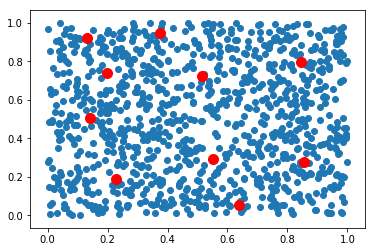

In [16]:
initial_centroids = [[0.08985740740740739,0.11413148148148151,10,0], [0.7714702222222213,0.758850666666667,9,0], [0.34755301204819283,0.47814939759036146,8,0], [0.7874712643678161,0.40742873563218385,7,0], [0.7082696969696967,0.1540515151515152,6,0], [0.3659,0.8479932835820899,5,0], [0.9138521739130435,0.17657826086956527,4,0], [0.4844528571428573,0.22703999999999994,3,0], [0.2912795180722892,0.16068554216867464,2,0]]
c_x_ses = [x[0] for x in initial_centroids]
c_y_s = [x[1] for x in initial_centroids]

## initial_points_list: 
initial_points = [[0.3816,0.5847,8,1], [0.5548,0.2117,3,1], [0.9,0.3012,4,1], [0.932,0.0165,4,1], [0.8183,0.2572,6,1], [0.7307,0.3526,7,1], [0.5864,0.645,9,1], [0.7631,0.9272,9,1], [0.3053,0.5049,8,1], [0.9122,0.8599,9,1], [0.9065,0.9287,9,1], [0.9458,0.0145,4,1], [0.8929,0.8792,9,1], [0.1028,0.2249,10,1], [0.6784,0.9536,9,1], [0.4398,0.1642,3,1], [0.1914,0.8768,5,1], [0.7909,0.1407,6,1], [0.3862,0.3849,8,1], [0.789,0.7954,9,1], [0.793,0.5154,7,1], [0.6869,0.762,9,1], [0.0869,0.1367,10,1], [0.4005,0.3671,8,1], [0.2612,0.6757,5,1], [0.2892,0.1557,2,1], [0.8706,0.3615,7,1], [0.8104,0.7874,9,1], [0.7388,0.9518,9,1], [0.299,0.6415,5,1], [0.7603,0.5834,9,1], [0.3388,0.3409,8,1], [0.7272,0.2008,6,1], [0.7403,0.8962,9,1], [0.8026,0.1289,4,1], [0.1975,0.3341,2,1], [0.3187,0.6168,8,1], [0.7891,0.055,4,1], [0.7517,0.6271,9,1], [0.5495,0.9713,5,1], [0.6274,0.9986,5,1], [0.0358,0.1765,10,1], [0.2151,0.417,8,1], [0.6086,0.182,6,1], [0.3491,0.4896,8,1], [0.2415,0.548,8,1], [0.6946,0.5516,9,1], [0.7874,0.1454,6,1], [0.7296,0.6076,9,1], [0.9639,0.3902,4,1], [0.2561,0.9662,5,1], [0.1348,0.3192,2,1], [0.6478,0.6889,9,1], [0.4844,0.8356,5,1], [0.711,0.1469,6,1], [0.3385,0.4238,8,1], [0.2351,0.7625,5,1], [0.9176,0.613,9,1], [0.64,0.6076,9,1], [0.6312,0.5829,9,1], [0.5655,0.5104,9,1], [0.6273,0.232,6,1], [0.1242,0.1826,10,1], [0.4609,0.3993,8,1], [0.3435,0.7345,5,1], [0.469,0.9995,5,1], [0.8183,0.0056,4,1], [0.88,0.7647,9,1], [0.8939,0.1169,4,1], [0.2311,0.8586,5,1], [0.4333,0.3647,3,1], [0.5292,0.0958,3,1], [0.6875,0.4414,7,1], [0.9803,0.9055,9,1], [0.1827,0.0182,10,1], [0.8783,0.8597,9,1], [0.4539,0.5177,8,1], [0.6239,0.3912,7,1], [0.7776,0.4427,7,1], [0.3148,0.263,2,1], [0.0072,0.0543,10,1], [0.6859,0.3798,7,1], [0.6353,0.8015,9,1], [0.4073,0.4904,8,1], [0.2271,0.8617,5,1], [0.1813,0.9143,5,1], [0.0606,0.0389,10,1], [0.6226,0.7427,9,1], [0.9081,0.5632,9,1], [0.3081,0.4671,8,1], [0.3799,0.1684,2,1], [0.7565,0.9223,9,1], [0.1253,0.0722,10,1], [0.9686,0.3191,4,1], [0.4628,0.1322,3,1], [0.4031,0.8008,5,1], [0.7621,0.4296,7,1], [0.4615,0.6272,8,1], [0.9768,0.8011,9,1], [0.5409,0.5701,9,1], [0.3458,0.1657,2,1], [0.8423,0.2793,6,1], [0.6524,0.0343,6,1], [0.582,0.0648,6,1], [0.4192,0.6064,8,1], [0.2177,0.8283,5,1], [0.3393,0.615,8,1], [0.5717,0.8814,5,1], [0.7432,0.2666,6,1], [0.3611,0.1799,2,1], [0.775,0.4153,7,1], [0.7423,0.6937,9,1], [0.1316,0.1733,10,1], [0.5905,0.5872,9,1], [0.6148,0.7529,9,1], [0.4034,0.4122,8,1], [0.9653,0.8914,9,1], [0.9184,0.37,7,1], [0.5235,0.0403,3,1], [0.7077,0.9937,9,1], [0.2937,0.2126,2,1], [0.307,0.0632,2,1], [0.9411,0.4577,7,1], [0.4534,0.3506,3,1], [0.3083,0.8451,5,1], [0.9157,0.2535,4,1], [0.7148,0.6848,9,1], [0.2762,0.1036,2,1], [0.9074,0.8039,9,1], [0.5559,0.011,6,1], [0.0728,0.1306,10,1], [0.9969,0.4557,7,1], [0.7845,0.7011,9,1], [0.5136,0.3507,3,1], [0.4327,0.3024,3,1], [0.9223,0.6184,9,1], [0.4739,0.2683,3,1], [0.6645,0.0514,6,1], [0.8616,0.3236,7,1], [0.2846,0.2259,2,1], [0.5856,0.2632,3,1], [0.4975,0.3429,3,1], [0.7624,0.2129,6,1], [0.2199,0.1556,2,1], [0.4692,0.331,3,1], [0.4842,0.5891,8,1], [0.7463,0.1868,6,1], [0.7402,0.8848,9,1], [0.7263,0.8384,9,1], [0.9548,0.8499,9,1], [0.3528,0.2101,2,1], [0.8644,0.422,7,1], [0.6844,0.3025,7,1], [0.3638,0.937,5,1], [0.4152,0.7386,5,1], [0.8192,0.7575,9,1], [0.8757,0.7984,9,1], [0.9635,0.2089,4,1], [0.3677,0.4024,8,1], [0.3414,0.9967,5,1], [0.314,0.7403,5,1], [0.4229,0.5904,8,1], [0.7156,0.0978,6,1], [0.0784,0.155,10,1], [0.3786,0.9498,5,1], [0.1009,0.201,10,1], [0.5372,0.1272,3,1], [0.9277,0.6151,9,1], [0.8062,0.9117,9,1], [0.7806,0.4151,7,1], [0.7744,0.6063,9,1], [0.0632,0.1742,10,1], [0.6992,0.1637,6,1], [0.6487,0.6454,9,1], [0.4846,0.5907,8,1], [0.4887,0.9082,5,1], [0.5682,0.8831,5,1], [0.9518,0.1383,4,1], [0.23,0.1179,2,1], [0.3948,0.6371,8,1], [0.8077,0.782,9,1], [0.784,0.3165,7,1], [0.824,0.2334,6,1], [0.3716,0.4571,8,1], [0.6048,0.1054,6,1], [0.2471,0.6939,5,1], [0.4738,0.4986,8,1], [0.5029,0.8885,5,1], [0.5161,0.4901,8,1], [0.3704,0.8534,5,1], [0.925,0.9632,9,1], [0.602,0.8638,9,1], [0.8484,0.4989,7,1], [0.8131,0.7732,9,1], [0.956,0.442,7,1], [0.4904,0.8963,5,1], [0.5395,0.6771,9,1], [0.968,0.1471,4,1], [0.238,0.4285,8,1], [0.4585,0.0983,3,1], [0.9645,0.4189,7,1], [0.327,0.7022,5,1], [0.2894,0.3547,8,1], [0.5024,0.127,3,1], [0.8763,0.0818,4,1], [0.0283,0.1921,10,1], [0.3366,0.5739,8,1], [0.9745,0.4097,4,1], [0.9639,0.2166,4,1], [0.3795,0.7335,5,1], [0.7099,0.3831,7,1], [0.884,0.7909,9,1], [0.8675,0.5041,7,1], [0.8468,0.6526,9,1], [0.3741,0.5537,8,1], [0.3682,0.794,5,1], [0.4081,0.1329,2,1], [0.5054,0.0419,3,1], [0.9063,0.6984,9,1], [0.2641,0.4971,8,1], [0.3741,0.1597,2,1], [0.9065,0.927,9,1], [0.3607,0.9014,5,1], [0.9142,0.7636,9,1], [0.9041,0.2158,4,1], [0.7819,0.0531,4,1], [0.4888,0.4946,8,1], [0.3062,0.5808,8,1], [0.9449,0.0545,4,1], [0.3506,0.9364,5,1], [0.2186,0.9417,5,1], [0.7197,0.5199,9,1], [0.3174,0.7814,5,1], [0.4281,0.2378,3,1], [0.4717,0.2684,3,1], [0.1076,0.0047,10,1], [0.9965,0.4188,4,1], [0.2804,0.7229,5,1], [0.0147,0.0626,10,1], [0.7401,0.8874,9,1], [0.6488,0.685,9,1], [0.1908,0.4083,8,1], [0.5498,0.8336,5,1], [0.2506,0.3882,8,1], [0.6675,0.8725,9,1], [0.2624,0.5697,8,1], [0.3622,0.9334,5,1], [0.7049,0.6671,9,1], [0.4792,0.6274,8,1], [0.248,0.9229,5,1], [0.2371,0.0058,10,1], [0.3029,0.9501,5,1], [0.9894,0.0693,4,1], [0.2131,0.1574,2,1], [0.7589,0.3518,7,1], [0.8033,0.6884,9,1], [0.017,0.1414,10,1], [0.9965,0.4021,4,1], [0.7832,0.9591,9,1], [0.6329,0.9115,9,1], [0.4637,0.1411,3,1], [0.3243,0.0729,2,1], [0.2306,0.05,2,1], [0.9241,0.5831,9,1], [0.2461,0.4549,8,1], [0.5845,0.6016,9,1], [0.2793,0.7509,5,1], [0.2967,0.1573,2,1], [0.3647,0.8739,5,1], [0.1322,0.1364,10,1], [0.2919,0.6404,5,1], [0.1694,0.2671,2,1], [0.3305,0.2915,3,1], [0.9406,0.0137,4,1], [0.4508,0.0631,2,1], [0.6364,0.6381,9,1], [0.6239,0.4632,7,1], [0.9659,0.4855,7,1], [0.4704,0.3347,3,1], [0.6408,0.9724,9,1], [0.5724,0.5764,9,1], [0.4688,0.7756,5,1], [0.5121,0.4907,8,1], [0.2526,0.2543,2,1], [0.6279,0.4727,7,1], [0.7752,0.9044,9,1], [0.4032,0.5794,8,1], [0.7865,0.8691,9,1], [0.0199,0.1983,10,1], [0.3985,0.4872,8,1], [0.8379,0.2273,6,1], [0.7045,0.819,9,1], [0.5877,0.7367,9,1], [0.38,0.9979,5,1], [0.7661,0.2793,6,1], [0.3803,0.9275,5,1], [0.6706,0.5569,9,1], [0.3712,0.1894,2,1], [0.8116,0.5832,9,1], [0.2275,0.8501,5,1], [0.8882,0.8621,9,1], [0.845,0.0758,4,1], [0.2672,0.4552,8,1], [0.8105,0.9205,9,1], [0.1557,0.3128,2,1], [0.3749,0.1138,2,1], [0.8379,0.4533,7,1], [0.3822,0.0417,2,1], [0.615,0.357,7,1], [0.5937,0.5722,9,1], [0.3278,0.2115,2,1], [0.505,0.1801,3,1], [0.9028,0.1938,4,1], [0.9847,0.7035,9,1], [0.7829,0.4541,7,1], [0.4396,0.4448,8,1], [0.5267,0.557,9,1], [0.5445,0.9121,5,1], [0.0559,0.0386,10,1], [0.6566,0.8424,9,1], [0.4579,0.7583,5,1], [0.9413,0.9649,9,1], [0.6876,0.6954,9,1], [0.5222,0.9924,5,1], [0.8813,0.0711,4,1], [0.8435,0.8357,9,1], [0.8559,0.2786,6,1], [0.4795,0.3916,3,1], [0.7371,0.7886,9,1], [0.0306,0.0127,10,1], [0.2856,0.9978,5,1], [0.4987,0.0767,3,1], [0.2051,0.2254,2,1], [0.3126,0.1735,2,1], [0.4956,0.3492,3,1], [0.3811,0.1821,2,1], [0.6251,0.121,6,1], [0.665,0.5609,9,1], [0.3399,0.9102,5,1], [0.2369,0.9232,5,1], [0.2453,0.8522,5,1], [0.2856,0.3054,2,1], [0.5435,0.1023,3,1], [0.5233,0.0559,3,1], [0.946,0.2537,4,1], [0.8603,0.5604,9,1], [0.7503,0.0796,6,1], [0.825,0.5997,9,1], [0.9642,0.4587,7,1], [0.2584,0.7232,5,1], [0.9088,0.6585,9,1], [0.0975,0.2531,2,1], [0.8231,0.0977,4,1], [0.6696,0.9077,9,1], [0.5764,0.8488,9,1], [0.5197,0.8316,5,1], [0.8538,0.4847,7,1], [0.708,0.0441,6,1], [0.0501,0.1077,10,1], [0.2657,0.5834,8,1], [0.8797,0.5823,9,1], [0.9324,0.3785,7,1], [0.3498,0.4435,8,1], [0.0443,0.1328,10,1], [0.9886,0.2002,4,1], [0.2749,0.1788,2,1], [0.3827,0.6589,5,1], [0.1508,0.0347,10,1], [0.5291,0.9571,5,1], [0.8634,0.3655,7,1], [0.458,0.393,8,1], [0.3672,0.0842,2,1], [0.6356,0.3335,7,1], [0.7003,0.9906,9,1], [0.2675,0.3602,8,1], [0.6149,0.8148,9,1], [0.3309,0.741,5,1], [0.5525,0.9956,5,1], [0.2433,0.1609,2,1], [0.7982,0.9782,9,1], [0.9219,0.8902,9,1], [0.8155,0.0121,4,1], [0.7523,0.1265,6,1], [0.4331,0.8618,5,1], [0.3653,0.3373,3,1], [0.5688,0.7504,9,1], [0.4619,0.3212,3,1], [0.4427,0.4961,8,1], [0.7326,0.2087,6,1], [0.7996,0.2988,6,1], [0.5937,0.0155,6,1], [0.4568,0.9563,5,1], [0.4077,0.0557,2,1], [0.9961,0.7901,9,1], [0.2071,0.4164,8,1], [0.3459,0.2985,3,1], [0.233,0.1595,2,1], [0.8401,0.0882,4,1], [0.6104,0.9465,5,1], [0.3693,0.4994,8,1], [0.7689,0.0116,4,1], [0.3809,0.8461,5,1], [0.7741,0.8585,9,1], [0.5227,0.2631,3,1], [0.9532,0.6589,9,1], [0.8775,0.2142,4,1], [0.5529,0.5285,9,1], [0.5052,0.0579,3,1], [0.2601,0.1308,2,1], [0.8718,0.2718,4,1], [0.334,0.7776,5,1], [0.4894,0.1226,3,1], [0.4186,0.0667,2,1], [0.9763,0.198,4,1], [0.6877,0.831,9,1], [0.3689,0.6664,5,1], [0.439,0.1539,3,1], [0.4117,0.892,5,1], [0.253,0.6706,5,1], [0.6031,0.8763,9,1], [0.7665,0.9149,9,1], [0.8616,0.6372,9,1], [0.2271,0.8626,5,1], [0.7387,0.8683,9,1], [0.253,0.4109,8,1], [0.7566,0.7867,9,1], [0.2352,0.0652,2,1], [0.5703,0.9455,5,1], [0.4744,0.3241,3,1], [0.6782,0.7074,9,1], [0.6358,0.6034,9,1], [0.7525,0.6711,9,1], [0.1507,0.2536,2,1], [0.6039,0.3236,7,1], [0.1684,0.1198,10,1], [0.313,0.8567,5,1], [0.2259,0.8164,5,1], [9.0E-4,0.2798,10,1], [0.2991,0.3567,8,1], [0.9203,0.1059,4,1], [0.265,0.054,2,1], [0.2361,0.2796,2,1], [0.9598,0.3918,4,1], [0.5206,0.7321,9,1], [0.3526,0.7004,5,1], [0.2878,0.4484,8,1], [0.2443,0.8667,5,1], [0.745,0.1491,6,1], [0.9373,0.5213,7,1], [0.7094,0.1741,6,1], [0.8403,0.2206,6,1], [0.4855,0.583,8,1], [0.8138,0.528,9,1], [0.9525,0.9722,9,1], [0.0053,0.287,10,1], [0.3992,0.2886,3,1], [0.3738,0.7853,5,1], [0.6467,0.0155,6,1], [0.6604,0.8391,9,1], [0.6563,0.5159,9,1], [0.7652,0.1899,6,1], [0.4447,0.6665,5,1], [0.7355,0.577,9,1], [0.7342,0.8692,9,1], [0.9225,0.8588,9,1], [0.1361,0.0553,10,1], [0.354,0.4165,8,1], [0.8678,0.9923,9,1], [0.452,0.1904,3,1], [0.2815,0.7379,5,1], [0.6416,0.0772,6,1], [0.6447,0.4803,7,1], [0.4114,0.0877,2,1], [0.3964,0.2307,3,1], [0.5951,0.3001,3,1], [0.2225,0.3968,8,1], [0.9771,0.9329,9,1], [0.9431,0.3546,4,1], [0.5038,0.3564,3,1], [0.1034,0.0823,10,1], [0.7088,0.3188,7,1], [0.4604,0.0785,2,1], [0.5915,0.3174,3,1], [0.8107,0.5121,7,1], [0.655,0.4201,7,1], [0.5386,0.6974,9,1], [0.4734,0.0762,3,1], [0.7458,0.0479,6,1], [0.5724,0.7832,9,1], [0.254,0.4359,8,1], [0.6781,0.7514,9,1], [0.286,0.8126,5,1], [0.4401,0.1749,3,1], [0.1672,0.0147,10,1], [0.4468,0.1023,2,1], [0.1472,0.1113,10,1], [0.9072,0.4963,7,1], [0.5712,0.3486,3,1], [0.583,0.1437,6,1], [0.37,0.9514,5,1], [0.0945,0.184,10,1], [0.8124,0.3868,7,1], [0.8274,0.5428,9,1], [0.8648,0.591,9,1], [0.4729,0.3379,3,1], [0.3213,0.584,8,1], [0.2844,0.9651,5,1], [0.4142,0.478,8,1], [0.2679,0.0518,2,1], [0.625,0.9128,9,1], [0.9749,0.6922,9,1], [0.8665,0.2074,4,1], [0.8534,0.6103,9,1], [0.8449,0.8828,9,1], [0.5633,0.5548,9,1], [0.9427,0.2419,4,1], [0.2987,0.4425,8,1], [0.6694,0.2484,6,1], [0.9988,0.8036,9,1], [0.7994,0.6513,9,1], [0.4578,0.4713,8,1], [0.9382,0.7618,9,1], [0.6974,0.1777,6,1], [0.3427,0.7609,5,1], [0.6073,0.0474,6,1], [0.4522,0.8797,5,1], [0.5646,0.7654,9,1], [0.3488,0.7624,5,1], [0.9501,0.9625,9,1], [0.247,0.3252,2,1], [0.8954,0.0258,4,1], [0.7078,0.9183,9,1], [0.9623,0.8902,9,1], [0.4641,0.0339,2,1], [0.6067,0.0527,6,1], [0.8317,0.3458,7,1], [0.7579,0.9125,9,1], [0.2579,0.8438,5,1], [0.8181,0.6613,9,1], [0.3332,0.4143,8,1], [0.9275,0.8021,9,1], [0.6404,0.1309,6,1], [0.1837,0.8783,5,1], [0.2564,0.1207,2,1], [0.9286,0.2845,4,1], [0.1278,0.2407,2,1], [0.7933,0.634,9,1], [0.7627,0.1324,6,1], [0.6119,0.9671,5,1], [0.3879,0.9151,5,1], [0.2178,0.331,2,1], [0.4301,0.7422,5,1], [0.2789,0.138,2,1], [0.3924,0.7037,5,1], [0.098,0.2457,2,1], [0.2571,0.2666,2,1], [0.7587,0.1993,6,1], [0.1912,0.0765,10,1], [0.5526,0.1621,3,1], [0.9342,0.0116,4,1], [0.3319,0.3931,8,1], [0.91,0.3659,7,1], [0.7475,0.3189,7,1], [0.7906,0.2147,6,1], [0.6675,0.7887,9,1], [0.5631,0.0578,6,1], [0.2978,0.3313,8,1], [0.8727,0.7724,9,1], [0.7017,0.3338,7,1], [0.4908,0.0685,3,1], [0.7095,0.9537,9,1], [0.4005,0.8058,5,1], [0.5044,0.6618,9,1], [0.7789,0.5423,9,1], [0.5441,0.6456,9,1], [0.711,0.4853,7,1], [0.6703,0.3063,7,1], [0.0537,0.0593,10,1], [0.6513,0.1146,6,1], [0.4956,0.1205,3,1], [0.9164,0.7424,9,1], [0.9608,0.3459,4,1], [0.2756,0.7861,5,1], [0.244,0.3489,8,1], [0.8523,0.5849,9,1], [0.3283,0.1349,2,1], [0.8554,0.7096,9,1], [0.8628,0.7828,9,1], [0.5033,0.8708,5,1], [0.9622,0.9036,9,1], [0.8001,0.9353,9,1], [0.509,0.2211,3,1], [0.3348,0.252,2,1], [0.4603,0.8757,5,1], [0.4189,0.527,8,1], [0.5665,0.2197,3,1], [0.8151,0.241,6,1], [0.5123,0.1419,3,1], [0.3309,0.7494,5,1], [0.6701,0.4132,7,1], [0.9211,0.1317,4,1], [0.8761,0.2199,4,1], [0.9368,0.8158,9,1], [0.5457,0.1075,3,1], [0.9825,0.0948,4,1], [0.5571,0.4284,7,1], [0.5995,0.4793,7,1], [0.2317,0.2612,2,1], [0.9764,0.8506,9,1], [0.289,0.9855,5,1], [0.0208,0.1384,10,1], [0.7581,0.9954,9,1], [0.8304,0.1724,4,1], [0.5657,0.4144,7,1], [0.314,0.4248,8,1], [0.2885,0.8133,5,1], [0.2832,0.9267,5,1], [0.8593,0.4666,7,1], [0.6642,0.6945,9,1], [0.9213,0.2229,4,1], [0.3265,0.5501,8,1], [0.7298,0.5109,9,1], [0.1693,0.0246,10,1], [0.5996,0.6449,9,1], [0.9853,0.8315,9,1], [0.3196,0.3938,8,1], [0.4787,0.6768,5,1], [0.8858,0.3531,7,1], [0.3883,0.0677,2,1], [0.8048,0.4742,7,1], [0.9032,0.9392,9,1], [0.2941,0.8666,5,1], [0.8116,0.0269,4,1], [0.8462,0.4902,7,1], [0.7672,0.514,7,1], [0.4805,0.794,5,1], [0.9746,0.9686,9,1], [0.8328,0.996,9,1], [0.8876,0.4387,7,1], [0.3135,0.6016,8,1], [0.7435,0.0914,6,1], [0.9773,0.6955,9,1], [0.7903,0.392,7,1], [0.8683,0.1002,4,1], [0.2427,0.0336,2,1], [0.1983,0.9449,5,1], [0.8276,0.5729,9,1], [0.3193,0.1091,2,1], [0.7456,0.6579,9,1], [0.4137,0.7446,5,1], [0.9577,0.3564,4,1], [0.4931,0.071,3,1], [0.4097,0.2395,3,1], [0.5355,0.9966,5,1], [0.3614,0.0603,2,1], [0.4931,0.3349,3,1], [0.5609,0.2278,3,1], [0.5142,0.2296,3,1], [0.7198,0.4124,7,1], [0.7394,0.363,7,1], [0.6737,0.3837,7,1], [0.4962,0.2892,3,1], [0.7013,0.3616,7,1], [0.8557,0.2014,4,1], [0.9847,0.925,9,1], [0.8503,0.2238,4,1], [0.7585,0.4319,7,1], [0.7374,0.7658,9,1], [0.7857,0.2992,7,1], [0.1711,0.0414,10,1], [0.7624,0.0607,6,1], [0.8608,0.9957,9,1], [0.6229,0.7547,9,1], [0.5344,0.9543,5,1], [0.4513,0.3866,3,1], [0.3588,0.0151,2,1], [0.6289,0.8624,9,1], [0.2527,0.3045,2,1], [0.2826,0.905,5,1], [0.3227,0.9588,5,1], [0.6718,0.7225,9,1], [0.0031,0.1457,10,1], [0.9416,0.4032,7,1], [0.8251,0.6258,9,1], [0.0408,0.2262,10,1], [0.2155,0.9005,5,1], [0.7572,0.0471,6,1], [0.1978,0.8378,5,1], [0.3085,0.2559,2,1], [0.2625,0.8354,5,1], [0.9657,0.9339,9,1], [0.6546,0.72,9,1], [0.4794,0.9792,5,1], [0.5048,0.0984,3,1], [0.7358,0.3506,7,1], [0.5347,0.673,9,1], [0.6916,0.5889,9,1], [0.9791,0.0202,4,1], [0.3237,0.581,8,1], [0.0876,0.1729,10,1], [0.8152,0.8437,9,1], [0.6551,0.1939,6,1], [0.9578,0.6033,9,1], [0.1452,0.053,10,1], [0.8084,0.5769,9,1], [0.6971,0.1869,6,1], [0.721,0.2433,6,1], [0.821,0.8572,9,1], [0.7967,0.6085,9,1], [0.7509,0.4088,7,1], [0.4196,0.9705,5,1], [0.5453,0.5435,9,1], [0.4394,0.2556,3,1], [0.7433,0.5607,9,1], [0.4297,0.0105,2,1], [0.5404,0.9313,5,1], [0.2172,0.1292,2,1], [0.9216,0.8485,9,1], [0.7821,0.7699,9,1], [0.9798,0.1679,4,1], [0.8938,0.6523,9,1], [0.6856,0.2158,6,1], [0.6542,0.1902,6,1], [0.6577,0.2739,6,1], [0.8808,0.723,9,1], [0.5416,0.1843,3,1], [0.5989,0.9153,9,1], [0.8279,0.4442,7,1], [0.8342,0.4932,7,1], [0.9811,0.2066,4,1], [0.7697,0.7175,9,1], [0.0738,0.2199,10,1], [0.0981,0.315,2,1], [0.2416,0.9529,5,1], [0.6532,0.3143,7,1], [0.9772,0.9477,9,1], [0.3671,0.6503,5,1], [0.5659,0.7016,9,1], [0.9044,0.7555,9,1], [0.836,0.3507,7,1], [0.9072,0.2217,4,1], [0.7507,0.7488,9,1], [0.4865,0.7638,5,1], [0.1245,0.1639,10,1], [0.7929,0.3199,7,1], [0.4283,0.4971,8,1], [0.3524,0.8133,5,1], [0.8543,0.5978,9,1], [0.8793,0.3997,7,1], [0.7582,0.6815,9,1], [0.1063,0.3356,2,1], [0.5365,0.6265,9,1], [0.8758,0.9456,9,1], [0.0087,0.01,10,1], [0.6263,0.643,9,1], [0.595,0.0805,6,1], [0.4668,0.2792,3,1], [0.1522,0.1839,2,1], [0.2661,0.8306,5,1], [0.2676,0.7918,5,1], [0.9748,0.9102,9,1], [0.9987,0.2776,4,1], [0.8283,0.8315,9,1], [0.2474,0.8295,5,1], [0.574,0.9924,5,1], [0.3158,0.635,5,1], [0.3603,0.7451,5,1], [0.6852,0.6537,9,1], [0.3938,0.5708,8,1], [0.8926,0.0306,4,1], [0.3527,0.0562,2,1], [0.4752,0.0072,2,1], [0.2959,0.2672,2,1], [0.8236,0.4066,7,1], [0.7666,0.0325,4,1], [0.6058,0.608,9,1], [0.0158,0.2446,10,1], [0.7746,0.6968,9,1], [0.8096,0.4269,7,1], [0.0344,0.1652,10,1], [0.582,0.96,5,1], [0.2003,0.9644,5,1], [0.829,0.3908,7,1], [0.457,0.287,3,1], [0.4326,0.6658,5,1], [0.7909,0.9176,9,1], [0.9242,0.6738,9,1], [0.2037,0.4111,8,1], [0.3286,0.9383,5,1], [0.355,0.8195,5,1], [0.2983,0.6657,5,1], [0.2636,0.043,2,1], [0.9736,0.839,9,1], [0.4308,0.6023,8,1], [0.5449,0.883,5,1], [0.3772,0.9791,5,1], [0.5711,0.8216,9,1], [0.3901,0.4328,8,1], [0.5117,0.6949,9,1], [0.2135,0.3679,8,1], [0.84,0.113,4,1], [0.3501,0.4068,8,1], [0.1919,0.0402,10,1], [0.7492,0.4215,7,1], [0.3499,0.3068,3,1], [0.7213,0.4756,7,1], [0.9415,0.1465,4,1], [0.8703,0.7015,9,1], [0.7157,0.5976,9,1], [0.1739,0.9268,5,1], [0.5422,0.8207,5,1], [0.6905,0.8572,9,1], [0.6207,0.162,6,1], [0.8868,0.3257,7,1], [0.1904,0.2877,2,1], [0.7455,0.1018,6,1], [0.705,0.1921,6,1], [0.8182,0.985,9,1], [0.7982,0.1959,6,1], [0.9839,0.3809,4,1], [0.6544,0.0897,6,1], [0.5606,0.089,6,1], [0.8662,0.6795,9,1], [0.2508,0.3869,8,1], [0.1316,0.1232,10,1], [0.4571,0.3537,3,1], [0.7122,0.3075,7,1], [0.9555,0.1576,4,1], [0.8435,0.263,6,1], [0.8266,0.932,9,1], [0.9608,0.8297,9,1], [0.9375,0.7749,9,1], [0.313,0.2531,2,1], [0.9942,0.4208,4,1], [0.1591,0.0482,10,1], [0.9827,0.0104,4,1], [0.3324,0.8844,5,1], [0.0437,0.2095,10,1], [0.2664,0.8099,5,1], [0.3854,0.5299,8,1], [0.0808,0.001,10,1], [0.2001,0.3768,8,1], [0.3295,0.0191,2,1], [0.0695,0.0103,10,1], [0.5416,0.6372,9,1], [0.9886,0.4555,7,1], [0.9706,0.3267,4,1], [0.3915,0.0408,2,1], [0.3611,0.0574,2,1], [0.9849,0.507,7,1], [0.1518,0.0487,10,1], [0.2769,0.1054,2,1], [0.7713,0.963,9,1], [0.5733,0.244,3,1], [0.2054,0.4372,8,1], [0.8489,0.7278,9,1], [0.2272,0.1623,2,1], [0.4988,0.1854,3,1], [0.7646,0.1635,6,1], [0.6666,0.3268,7,1], [0.7204,0.8865,9,1], [0.3723,0.4273,8,1], [0.9372,0.2318,4,1], [0.3431,0.0596,2,1], [0.5728,0.5774,9,1], [0.8155,0.3024,7,1], [0.8635,0.3704,7,1], [0.4498,0.337,3,1], [0.6118,0.87,9,1], [0.7974,0.4157,7,1], [0.9864,0.978,9,1]]
fig = plt.figure()

x_ses = [x[0] for x in initial_points]
y_s = [x[1] for x in initial_points]

# create a simple figure
plt.scatter(x_ses, y_s )
plt.scatter(c_x_ses, c_y_s, c='r', s=100)
    
plt.show()

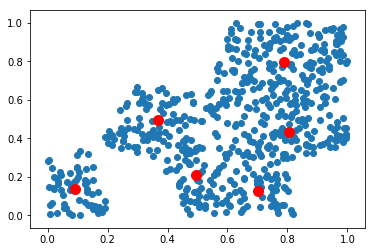

In [19]:
initial_centroids = [[0.09148524590163933,0.13613278688524597,10,0], [0.790078421052631,0.7948373684210528,9,0], [0.3694077669902911,0.49262330097087365,8,0], [0.8053895652173914,0.4306895652173913,7,0], [0.7031222222222219,0.12421587301587299,6,0], [0.49439041095890407,0.21045205479452045,3,0]]
c_x_ses = [x[0] for x in initial_centroids]
c_y_s = [x[1] for x in initial_centroids]

## initial_points_list: 
initial_points = [[0.3816,0.5847,8,1], [0.5548,0.2117,3,1], [0.7307,0.3526,7,1], [0.5864,0.645,9,1], [0.7631,0.9272,9,1], [0.3053,0.5049,8,1], [0.9122,0.8599,9,1], [0.9065,0.9287,9,1], [0.8929,0.8792,9,1], [0.1028,0.2249,10,1], [0.6784,0.9536,9,1], [0.4398,0.1642,3,1], [0.7909,0.1407,6,1], [0.3862,0.3849,8,1], [0.789,0.7954,9,1], [0.793,0.5154,7,1], [0.6869,0.762,9,1], [0.0869,0.1367,10,1], [0.4005,0.3671,8,1], [0.8706,0.3615,7,1], [0.8104,0.7874,9,1], [0.7388,0.9518,9,1], [0.299,0.6415,8,1], [0.7603,0.5834,9,1], [0.3388,0.3409,8,1], [0.7272,0.2008,6,1], [0.7403,0.8962,9,1], [0.8026,0.1289,6,1], [0.3187,0.6168,8,1], [0.7891,0.055,6,1], [0.7517,0.6271,9,1], [0.6274,0.9986,9,1], [0.0358,0.1765,10,1], [0.2151,0.417,8,1], [0.6086,0.182,6,1], [0.3491,0.4896,8,1], [0.2415,0.548,8,1], [0.6946,0.5516,7,1], [0.7874,0.1454,6,1], [0.7296,0.6076,9,1], [0.9639,0.3902,7,1], [0.1348,0.3192,10,1], [0.6478,0.6889,9,1], [0.711,0.1469,6,1], [0.3385,0.4238,8,1], [0.9176,0.613,9,1], [0.64,0.6076,9,1], [0.6312,0.5829,9,1], [0.5655,0.5104,8,1], [0.6273,0.232,6,1], [0.1242,0.1826,10,1], [0.4609,0.3993,8,1], [0.8183,0.0056,6,1], [0.88,0.7647,9,1], [0.4333,0.3647,8,1], [0.5292,0.0958,3,1], [0.6875,0.4414,7,1], [0.9803,0.9055,9,1], [0.1827,0.0182,10,1], [0.8783,0.8597,9,1], [0.4539,0.5177,8,1], [0.6239,0.3912,7,1], [0.7776,0.4427,7,1], [0.0072,0.0543,10,1], [0.6859,0.3798,7,1], [0.6353,0.8015,9,1], [0.4073,0.4904,8,1], [0.0606,0.0389,10,1], [0.6226,0.7427,9,1], [0.9081,0.5632,7,1], [0.3081,0.4671,8,1], [0.7565,0.9223,9,1], [0.1253,0.0722,10,1], [0.4628,0.1322,3,1], [0.7621,0.4296,7,1], [0.4615,0.6272,8,1], [0.9768,0.8011,9,1], [0.5409,0.5701,8,1], [0.6524,0.0343,6,1], [0.582,0.0648,6,1], [0.4192,0.6064,8,1], [0.3393,0.615,8,1], [0.7432,0.2666,6,1], [0.775,0.4153,7,1], [0.7423,0.6937,9,1], [0.1316,0.1733,10,1], [0.5905,0.5872,9,1], [0.6148,0.7529,9,1], [0.4034,0.4122,8,1], [0.9653,0.8914,9,1], [0.9184,0.37,7,1], [0.5235,0.0403,3,1], [0.7077,0.9937,9,1], [0.9411,0.4577,7,1], [0.4534,0.3506,3,1], [0.7148,0.6848,9,1], [0.9074,0.8039,9,1], [0.5559,0.011,6,1], [0.0728,0.1306,10,1], [0.9969,0.4557,7,1], [0.7845,0.7011,9,1], [0.5136,0.3507,3,1], [0.4327,0.3024,3,1], [0.9223,0.6184,9,1], [0.4739,0.2683,3,1], [0.6645,0.0514,6,1], [0.8616,0.3236,7,1], [0.5856,0.2632,3,1], [0.4975,0.3429,3,1], [0.7624,0.2129,6,1], [0.4692,0.331,3,1], [0.4842,0.5891,8,1], [0.7463,0.1868,6,1], [0.7402,0.8848,9,1], [0.7263,0.8384,9,1], [0.9548,0.8499,9,1], [0.8644,0.422,7,1], [0.6844,0.3025,7,1], [0.8192,0.7575,9,1], [0.8757,0.7984,9,1], [0.3677,0.4024,8,1], [0.4229,0.5904,8,1], [0.7156,0.0978,6,1], [0.0784,0.155,10,1], [0.1009,0.201,10,1], [0.5372,0.1272,3,1], [0.9277,0.6151,9,1], [0.8062,0.9117,9,1], [0.7806,0.4151,7,1], [0.7744,0.6063,9,1], [0.0632,0.1742,10,1], [0.6992,0.1637,6,1], [0.6487,0.6454,9,1], [0.4846,0.5907,8,1], [0.3948,0.6371,8,1], [0.8077,0.782,9,1], [0.784,0.3165,7,1], [0.3716,0.4571,8,1], [0.6048,0.1054,6,1], [0.4738,0.4986,8,1], [0.5161,0.4901,8,1], [0.925,0.9632,9,1], [0.602,0.8638,9,1], [0.8484,0.4989,7,1], [0.8131,0.7732,9,1], [0.956,0.442,7,1], [0.238,0.4285,8,1], [0.4585,0.0983,3,1], [0.9645,0.4189,7,1], [0.2894,0.3547,8,1], [0.5024,0.127,3,1], [0.0283,0.1921,10,1], [0.3366,0.5739,8,1], [0.9745,0.4097,7,1], [0.7099,0.3831,7,1], [0.884,0.7909,9,1], [0.8675,0.5041,7,1], [0.8468,0.6526,9,1], [0.3741,0.5537,8,1], [0.5054,0.0419,3,1], [0.9063,0.6984,9,1], [0.2641,0.4971,8,1], [0.9065,0.927,9,1], [0.9142,0.7636,9,1], [0.7819,0.0531,6,1], [0.4888,0.4946,8,1], [0.3062,0.5808,8,1], [0.7197,0.5199,7,1], [0.4281,0.2378,3,1], [0.4717,0.2684,3,1], [0.1076,0.0047,10,1], [0.9965,0.4188,7,1], [0.0147,0.0626,10,1], [0.7401,0.8874,9,1], [0.6488,0.685,9,1], [0.1908,0.4083,8,1], [0.2506,0.3882,8,1], [0.6675,0.8725,9,1], [0.2624,0.5697,8,1], [0.7049,0.6671,9,1], [0.4792,0.6274,8,1], [0.7589,0.3518,7,1], [0.8033,0.6884,9,1], [0.017,0.1414,10,1], [0.9965,0.4021,7,1], [0.7832,0.9591,9,1], [0.6329,0.9115,9,1], [0.4637,0.1411,3,1], [0.9241,0.5831,7,1], [0.2461,0.4549,8,1], [0.5845,0.6016,9,1], [0.1322,0.1364,10,1], [0.2919,0.6404,8,1], [0.4508,0.0631,3,1], [0.6364,0.6381,9,1], [0.6239,0.4632,7,1], [0.9659,0.4855,7,1], [0.4704,0.3347,3,1], [0.6408,0.9724,9,1], [0.5724,0.5764,8,1], [0.5121,0.4907,8,1], [0.6279,0.4727,7,1], [0.7752,0.9044,9,1], [0.4032,0.5794,8,1], [0.7865,0.8691,9,1], [0.0199,0.1983,10,1], [0.3985,0.4872,8,1], [0.7045,0.819,9,1], [0.5877,0.7367,9,1], [0.7661,0.2793,7,1], [0.6706,0.5569,7,1], [0.8116,0.5832,7,1], [0.8882,0.8621,9,1], [0.2672,0.4552,8,1], [0.8105,0.9205,9,1], [0.8379,0.4533,7,1], [0.615,0.357,7,1], [0.5937,0.5722,7,1], [0.505,0.1801,3,1], [0.9847,0.7035,9,1], [0.7829,0.4541,7,1], [0.4396,0.4448,8,1], [0.5267,0.557,8,1], [0.0559,0.0386,10,1], [0.6566,0.8424,9,1], [0.9413,0.9649,9,1], [0.6876,0.6954,9,1], [0.8435,0.8357,9,1], [0.4795,0.3916,8,1], [0.7371,0.7886,9,1], [0.0306,0.0127,10,1], [0.4987,0.0767,3,1], [0.4956,0.3492,3,1], [0.6251,0.121,6,1], [0.665,0.5609,7,1], [0.5435,0.1023,3,1], [0.5233,0.0559,3,1], [0.8603,0.5604,7,1], [0.7503,0.0796,6,1], [0.825,0.5997,9,1], [0.9642,0.4587,7,1], [0.9088,0.6585,9,1], [0.0975,0.2531,10,1], [0.6696,0.9077,9,1], [0.8538,0.4847,7,1], [0.708,0.0441,6,1], [0.0501,0.1077,10,1], [0.2657,0.5834,8,1], [0.8797,0.5823,7,1], [0.9324,0.3785,7,1], [0.3498,0.4435,8,1], [0.0443,0.1328,10,1], [0.3827,0.6589,8,1], [0.1508,0.0347,10,1], [0.8634,0.3655,7,1], [0.458,0.393,8,1], [0.6356,0.3335,7,1], [0.7003,0.9906,9,1], [0.2675,0.3602,8,1], [0.6149,0.8148,9,1], [0.7982,0.9782,9,1], [0.9219,0.8902,9,1], [0.8155,0.0121,6,1], [0.7523,0.1265,6,1], [0.3653,0.3373,8,1], [0.5688,0.7504,9,1], [0.4619,0.3212,3,1], [0.4427,0.4961,8,1], [0.7326,0.2087,6,1], [0.7996,0.2988,7,1], [0.5937,0.0155,6,1], [0.9961,0.7901,9,1], [0.2071,0.4164,8,1], [0.6104,0.9465,9,1], [0.3693,0.4994,8,1], [0.7689,0.0116,6,1], [0.7741,0.8585,9,1], [0.5227,0.2631,3,1], [0.9532,0.6589,9,1], [0.5529,0.5285,8,1], [0.5052,0.0579,3,1], [0.4894,0.1226,3,1], [0.6877,0.831,9,1], [0.439,0.1539,3,1], [0.6031,0.8763,9,1], [0.7665,0.9149,9,1], [0.8616,0.6372,9,1], [0.7387,0.8683,9,1], [0.253,0.4109,8,1], [0.7566,0.7867,9,1], [0.4744,0.3241,3,1], [0.6782,0.7074,9,1], [0.6358,0.6034,9,1], [0.7525,0.6711,9,1], [0.1507,0.2536,10,1], [0.6039,0.3236,3,1], [0.1684,0.1198,10,1], [9.0E-4,0.2798,10,1], [0.2991,0.3567,8,1], [0.9598,0.3918,7,1], [0.2878,0.4484,8,1], [0.745,0.1491,6,1], [0.9373,0.5213,7,1], [0.7094,0.1741,6,1], [0.4855,0.583,8,1], [0.8138,0.528,7,1], [0.9525,0.9722,9,1], [0.0053,0.287,10,1], [0.3992,0.2886,3,1], [0.6467,0.0155,6,1], [0.6604,0.8391,9,1], [0.6563,0.5159,7,1], [0.7652,0.1899,6,1], [0.7355,0.577,7,1], [0.7342,0.8692,9,1], [0.9225,0.8588,9,1], [0.1361,0.0553,10,1], [0.354,0.4165,8,1], [0.8678,0.9923,9,1], [0.452,0.1904,3,1], [0.6416,0.0772,6,1], [0.6447,0.4803,7,1], [0.3964,0.2307,3,1], [0.5951,0.3001,3,1], [0.2225,0.3968,8,1], [0.9771,0.9329,9,1], [0.9431,0.3546,7,1], [0.5038,0.3564,3,1], [0.1034,0.0823,10,1], [0.7088,0.3188,7,1], [0.4604,0.0785,3,1], [0.5915,0.3174,3,1], [0.8107,0.5121,7,1], [0.655,0.4201,7,1], [0.4734,0.0762,3,1], [0.7458,0.0479,6,1], [0.5724,0.7832,9,1], [0.254,0.4359,8,1], [0.6781,0.7514,9,1], [0.4401,0.1749,3,1], [0.1672,0.0147,10,1], [0.4468,0.1023,3,1], [0.1472,0.1113,10,1], [0.9072,0.4963,7,1], [0.5712,0.3486,3,1], [0.583,0.1437,6,1], [0.0945,0.184,10,1], [0.8124,0.3868,7,1], [0.8274,0.5428,7,1], [0.8648,0.591,9,1], [0.4729,0.3379,3,1], [0.3213,0.584,8,1], [0.4142,0.478,8,1], [0.625,0.9128,9,1], [0.9749,0.6922,9,1], [0.8534,0.6103,9,1], [0.8449,0.8828,9,1], [0.5633,0.5548,8,1], [0.2987,0.4425,8,1], [0.6694,0.2484,6,1], [0.9988,0.8036,9,1], [0.7994,0.6513,9,1], [0.4578,0.4713,8,1], [0.9382,0.7618,9,1], [0.6974,0.1777,6,1], [0.6073,0.0474,6,1], [0.5646,0.7654,9,1], [0.9501,0.9625,9,1], [0.7078,0.9183,9,1], [0.9623,0.8902,9,1], [0.4641,0.0339,3,1], [0.6067,0.0527,6,1], [0.8317,0.3458,7,1], [0.7579,0.9125,9,1], [0.8181,0.6613,9,1], [0.3332,0.4143,8,1], [0.9275,0.8021,9,1], [0.6404,0.1309,6,1], [0.1278,0.2407,10,1], [0.7933,0.634,9,1], [0.7627,0.1324,6,1], [0.6119,0.9671,9,1], [0.098,0.2457,10,1], [0.7587,0.1993,6,1], [0.1912,0.0765,10,1], [0.5526,0.1621,3,1], [0.3319,0.3931,8,1], [0.91,0.3659,7,1], [0.7475,0.3189,7,1], [0.7906,0.2147,6,1], [0.6675,0.7887,9,1], [0.5631,0.0578,6,1], [0.2978,0.3313,8,1], [0.8727,0.7724,9,1], [0.7017,0.3338,7,1], [0.4908,0.0685,3,1], [0.7095,0.9537,9,1], [0.7789,0.5423,7,1], [0.5441,0.6456,9,1], [0.711,0.4853,7,1], [0.6703,0.3063,7,1], [0.0537,0.0593,10,1], [0.6513,0.1146,6,1], [0.4956,0.1205,3,1], [0.9164,0.7424,9,1], [0.244,0.3489,8,1], [0.8523,0.5849,7,1], [0.8554,0.7096,9,1], [0.8628,0.7828,9,1], [0.9622,0.9036,9,1], [0.8001,0.9353,9,1], [0.509,0.2211,3,1], [0.4189,0.527,8,1], [0.5665,0.2197,3,1], [0.5123,0.1419,3,1], [0.6701,0.4132,7,1], [0.9368,0.8158,9,1], [0.5457,0.1075,3,1], [0.5571,0.4284,3,1], [0.5995,0.4793,7,1], [0.9764,0.8506,9,1], [0.0208,0.1384,10,1], [0.7581,0.9954,9,1], [0.5657,0.4144,3,1], [0.314,0.4248,8,1], [0.8593,0.4666,7,1], [0.6642,0.6945,9,1], [0.3265,0.5501,8,1], [0.7298,0.5109,7,1], [0.1693,0.0246,10,1], [0.5996,0.6449,9,1], [0.9853,0.8315,9,1], [0.3196,0.3938,8,1], [0.8858,0.3531,7,1], [0.8048,0.4742,7,1], [0.9032,0.9392,9,1], [0.8116,0.0269,6,1], [0.8462,0.4902,7,1], [0.7672,0.514,7,1], [0.9746,0.9686,9,1], [0.8328,0.996,9,1], [0.8876,0.4387,7,1], [0.3135,0.6016,8,1], [0.7435,0.0914,6,1], [0.9773,0.6955,9,1], [0.7903,0.392,7,1], [0.8276,0.5729,7,1], [0.7456,0.6579,9,1], [0.9577,0.3564,7,1], [0.4931,0.071,3,1], [0.4097,0.2395,3,1], [0.4931,0.3349,3,1], [0.5609,0.2278,3,1], [0.5142,0.2296,3,1], [0.7198,0.4124,7,1], [0.7394,0.363,7,1], [0.6737,0.3837,7,1], [0.4962,0.2892,3,1], [0.7013,0.3616,7,1], [0.9847,0.925,9,1], [0.7585,0.4319,7,1], [0.7374,0.7658,9,1], [0.7857,0.2992,7,1], [0.1711,0.0414,10,1], [0.7624,0.0607,6,1], [0.8608,0.9957,9,1], [0.6229,0.7547,9,1], [0.4513,0.3866,8,1], [0.6289,0.8624,9,1], [0.6718,0.7225,9,1], [0.0031,0.1457,10,1], [0.9416,0.4032,7,1], [0.8251,0.6258,9,1], [0.0408,0.2262,10,1], [0.7572,0.0471,6,1], [0.9657,0.9339,9,1], [0.6546,0.72,9,1], [0.5048,0.0984,3,1], [0.7358,0.3506,7,1], [0.6916,0.5889,9,1], [0.3237,0.581,8,1], [0.0876,0.1729,10,1], [0.8152,0.8437,9,1], [0.6551,0.1939,6,1], [0.9578,0.6033,9,1], [0.1452,0.053,10,1], [0.8084,0.5769,7,1], [0.6971,0.1869,6,1], [0.721,0.2433,6,1], [0.821,0.8572,9,1], [0.7967,0.6085,9,1], [0.7509,0.4088,7,1], [0.5453,0.5435,8,1], [0.4394,0.2556,3,1], [0.7433,0.5607,7,1], [0.9216,0.8485,9,1], [0.7821,0.7699,9,1], [0.8938,0.6523,9,1], [0.6856,0.2158,6,1], [0.6542,0.1902,6,1], [0.6577,0.2739,6,1], [0.8808,0.723,9,1], [0.5416,0.1843,3,1], [0.5989,0.9153,9,1], [0.8279,0.4442,7,1], [0.8342,0.4932,7,1], [0.7697,0.7175,9,1], [0.0738,0.2199,10,1], [0.0981,0.315,10,1], [0.6532,0.3143,7,1], [0.9772,0.9477,9,1], [0.3671,0.6503,8,1], [0.5659,0.7016,9,1], [0.9044,0.7555,9,1], [0.836,0.3507,7,1], [0.7507,0.7488,9,1], [0.1245,0.1639,10,1], [0.7929,0.3199,7,1], [0.4283,0.4971,8,1], [0.8543,0.5978,9,1], [0.8793,0.3997,7,1], [0.7582,0.6815,9,1], [0.1063,0.3356,10,1], [0.5365,0.6265,8,1], [0.8758,0.9456,9,1], [0.0087,0.01,10,1], [0.6263,0.643,9,1], [0.595,0.0805,6,1], [0.4668,0.2792,3,1], [0.1522,0.1839,10,1], [0.9748,0.9102,9,1], [0.8283,0.8315,9,1], [0.3158,0.635,8,1], [0.6852,0.6537,9,1], [0.3938,0.5708,8,1], [0.4752,0.0072,3,1], [0.8236,0.4066,7,1], [0.7666,0.0325,6,1], [0.6058,0.608,9,1], [0.0158,0.2446,10,1], [0.7746,0.6968,9,1], [0.8096,0.4269,7,1], [0.0344,0.1652,10,1], [0.829,0.3908,7,1], [0.457,0.287,3,1], [0.7909,0.9176,9,1], [0.9242,0.6738,9,1], [0.2037,0.4111,8,1], [0.2983,0.6657,8,1], [0.9736,0.839,9,1], [0.4308,0.6023,8,1], [0.3901,0.4328,8,1], [0.2135,0.3679,8,1], [0.3501,0.4068,8,1], [0.1919,0.0402,10,1], [0.7492,0.4215,7,1], [0.3499,0.3068,3,1], [0.7213,0.4756,7,1], [0.8703,0.7015,9,1], [0.7157,0.5976,9,1], [0.6905,0.8572,9,1], [0.6207,0.162,6,1], [0.8868,0.3257,7,1], [0.7455,0.1018,6,1], [0.705,0.1921,6,1], [0.8182,0.985,9,1], [0.7982,0.1959,6,1], [0.9839,0.3809,7,1], [0.6544,0.0897,6,1], [0.5606,0.089,3,1], [0.8662,0.6795,9,1], [0.2508,0.3869,8,1], [0.1316,0.1232,10,1], [0.4571,0.3537,3,1], [0.7122,0.3075,7,1], [0.8266,0.932,9,1], [0.9608,0.8297,9,1], [0.9375,0.7749,9,1], [0.9942,0.4208,7,1], [0.1591,0.0482,10,1], [0.0437,0.2095,10,1], [0.3854,0.5299,8,1], [0.0808,0.001,10,1], [0.2001,0.3768,8,1], [0.0695,0.0103,10,1], [0.5416,0.6372,8,1], [0.9886,0.4555,7,1], [0.9849,0.507,7,1], [0.1518,0.0487,10,1], [0.7713,0.963,9,1], [0.5733,0.244,3,1], [0.2054,0.4372,8,1], [0.8489,0.7278,9,1], [0.4988,0.1854,3,1], [0.7646,0.1635,6,1], [0.6666,0.3268,7,1], [0.7204,0.8865,9,1], [0.3723,0.4273,8,1], [0.5728,0.5774,8,1], [0.8155,0.3024,7,1], [0.8635,0.3704,7,1], [0.4498,0.337,3,1], [0.6118,0.87,9,1], [0.7974,0.4157,7,1], [0.9864,0.978,9,1]]
fig = plt.figure()

x_ses = [x[0] for x in initial_points]
y_s = [x[1] for x in initial_points]

# create a simple figure
plt.scatter(x_ses, y_s )
plt.scatter(c_x_ses, c_y_s, c='r', s=100)
    
plt.show()

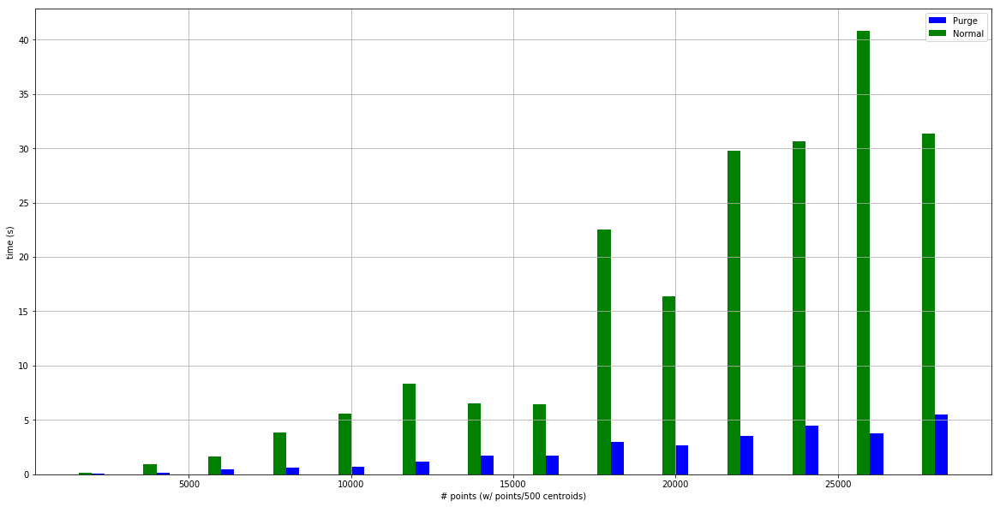

In [117]:
%matplotlib inline

import matplotlib.pyplot as plt

bar_width = 400
fig, ax = plt.subplots(figsize=(20,10))

plt.xlabel('# points (w/ points/500 centroids)')
plt.ylabel('time (s)')
plt.grid(True)

bars1 = ax.bar(np.array(list(times['purge'].keys())) + bar_width / 2, times['purge'].values(),color='b',align='center', width = bar_width)
bars2 = ax.bar(np.array(list(times['normal'].keys())) - bar_width / 2, times['normal'].values(),color='g',align='center', width = bar_width)
ax.legend((bars1[0], bars2[0]), ('Purge', 'Normal'))

plt.show()


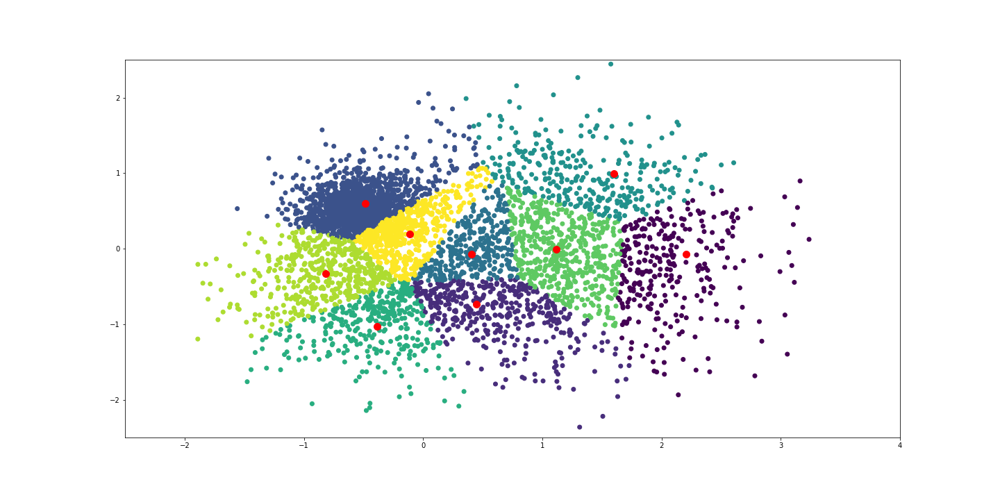
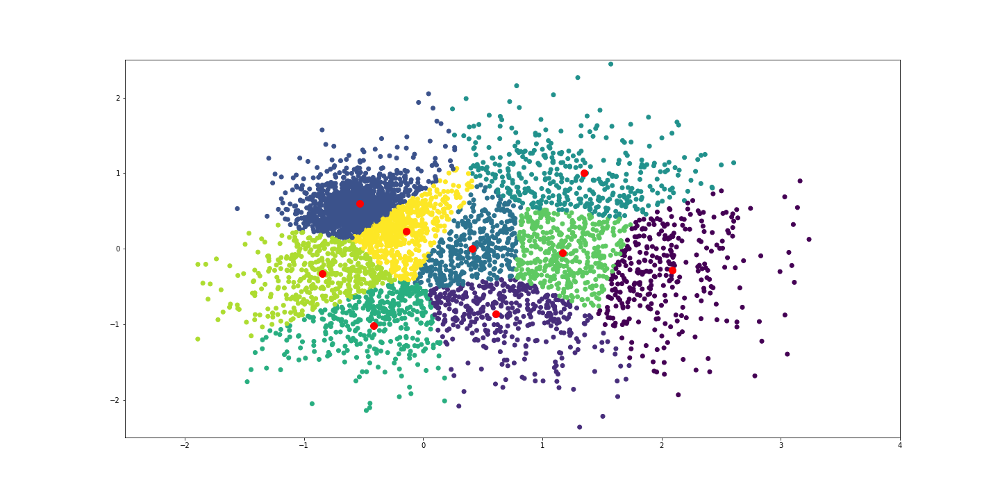
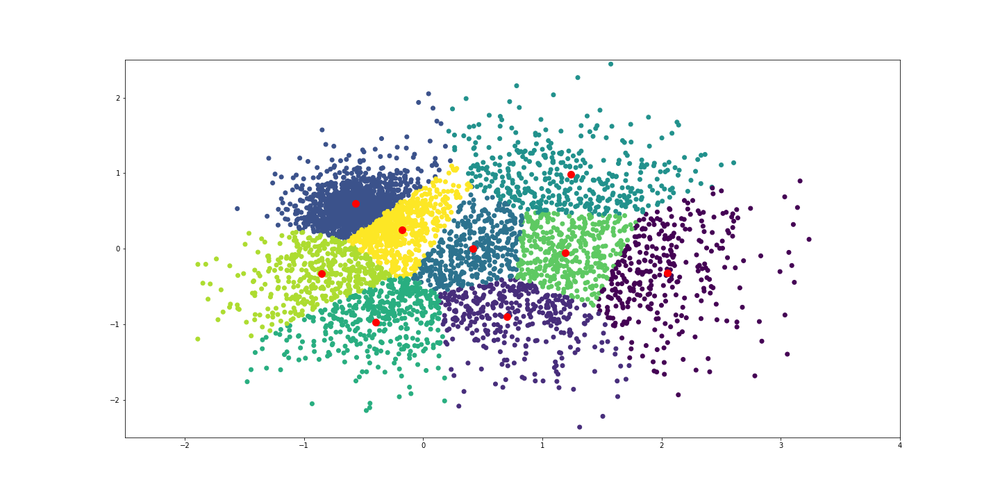
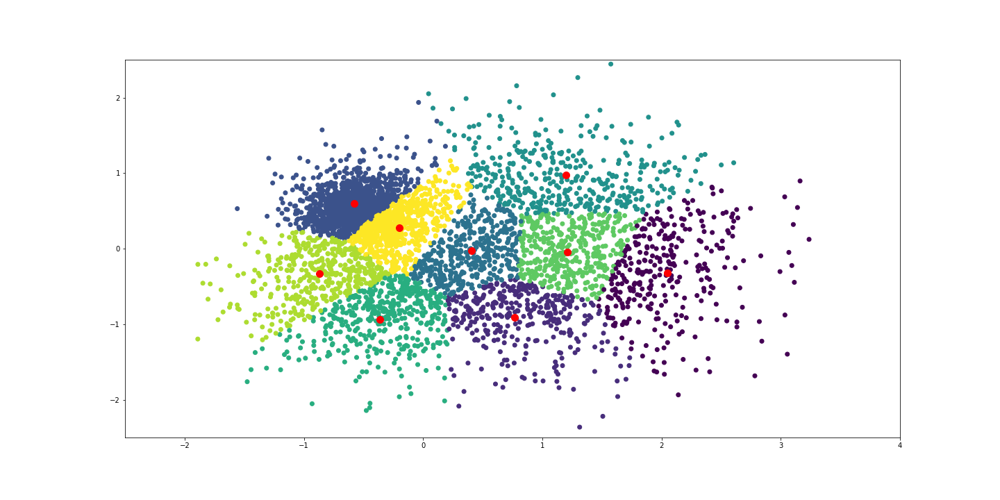
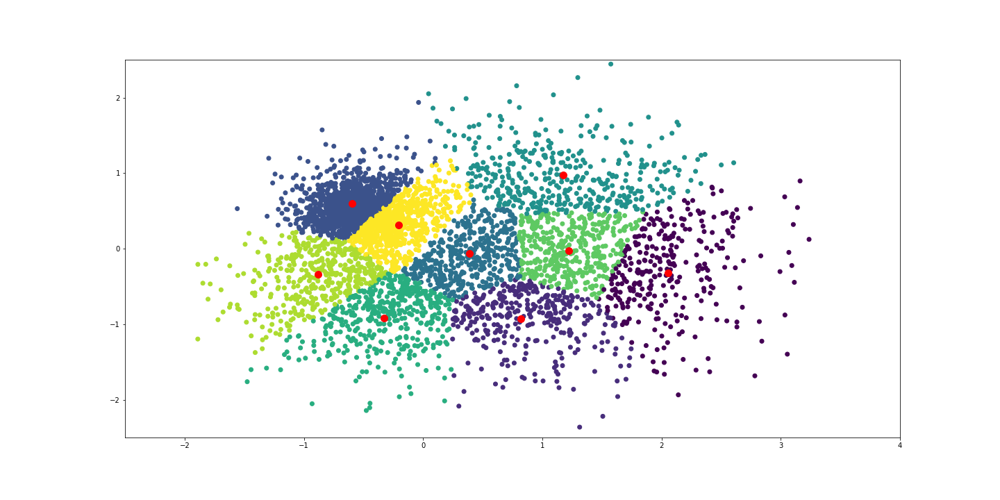
...
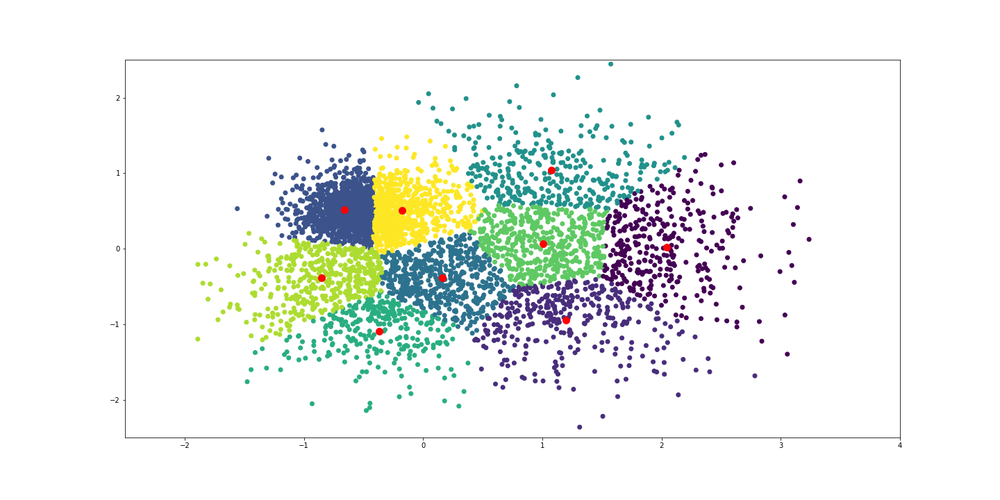
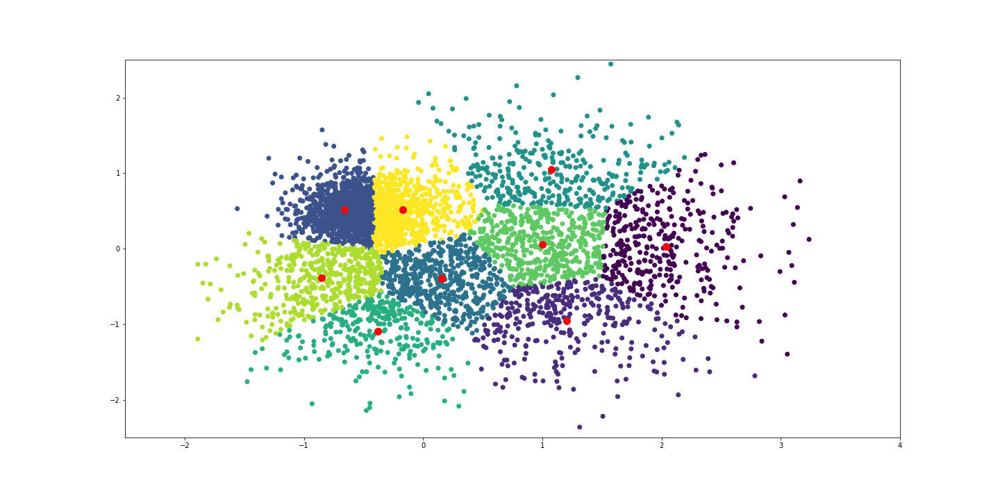
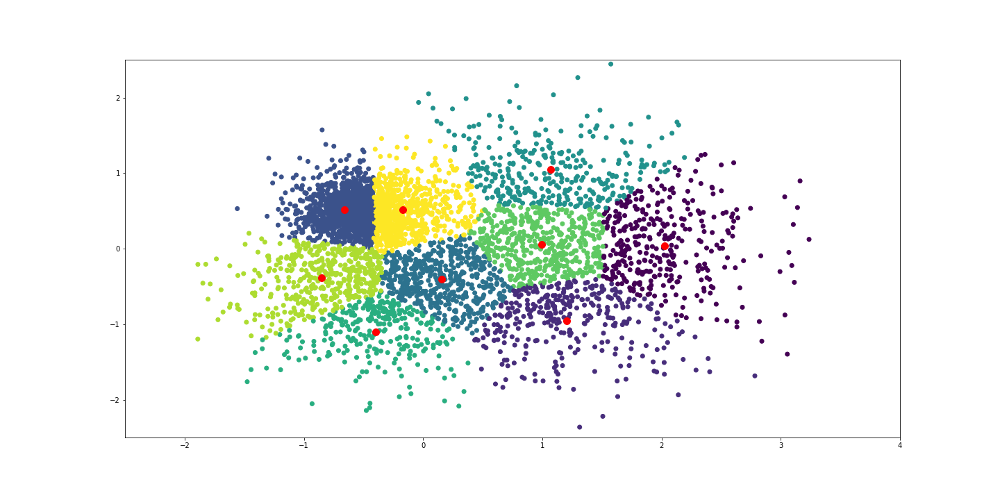
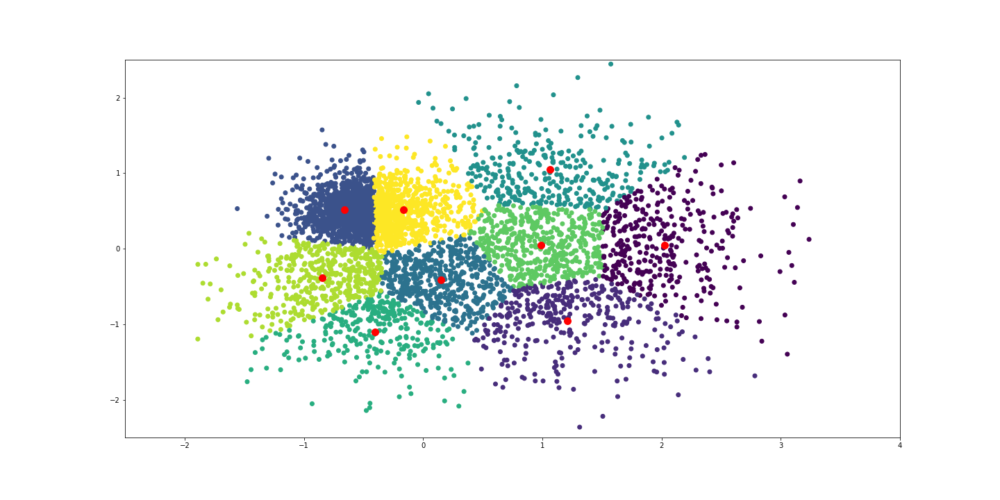
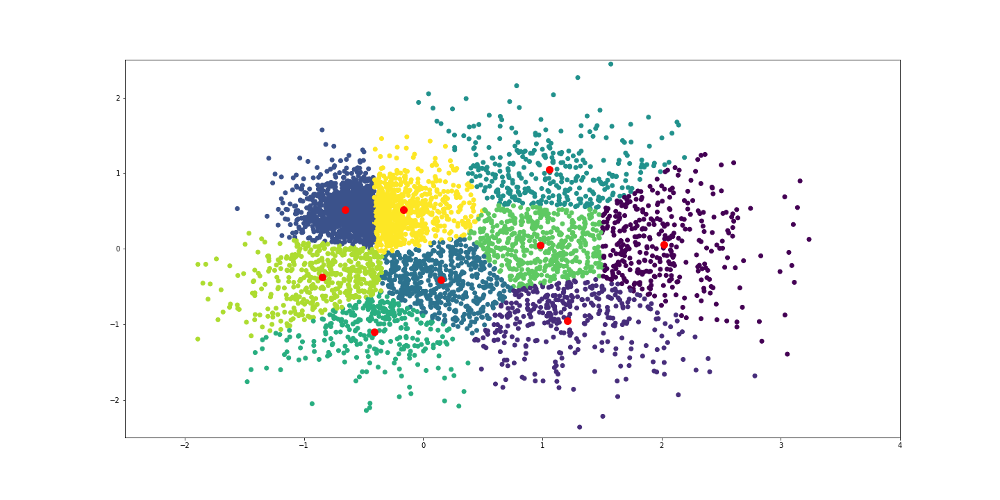

In [64]:
from JSAnimation import IPython_display
from matplotlib import animation

# create a simple animation
fig = plt.figure(figsize=(20,10))
ax = plt.axes(xlim=(-4, 4), ylim=(-4, 4))

exp = 9
n_points = 2 ** exp
n_centroids = exp
epsilon = 0.00001

points = init_points(n_points)    
centroids = initialize_centroids(points, n_centroids)
original_centroids = centroids

def init():
    line.set_data([], [])
    return line,

def animate(i):
    global points, centroids
    
    if len(centroids) > 0 and len(points) > 0:
        closest = closest_centroid(points, centroids)
        if mode == 'normal':
            centroids, max_change = move_centroids(mode, points, closest, centroids)
        else:
            centroids, max_change, new_removed_centroids, new_removed_points, points = move_centroids(mode, points, closest, centroids)
    
        if len(centroids) > 0 and len(points) > 0:
            ax.cla()
            ax.set_xlim([-2.5,4])
            ax.set_ylim([-2.5,2.5])
            closest = closest_centroid(points, centroids)
            ax.scatter(points[:, 0], points[:, 1], c=closest)
            ax.scatter(centroids[:, 0], centroids[:, 1], c='r', s=100)        
    
                    
    return line,

mode = 'normal'

animation.FuncAnimation(fig, animate, init_func=init,
                        frames=25, interval=1, blit=True)


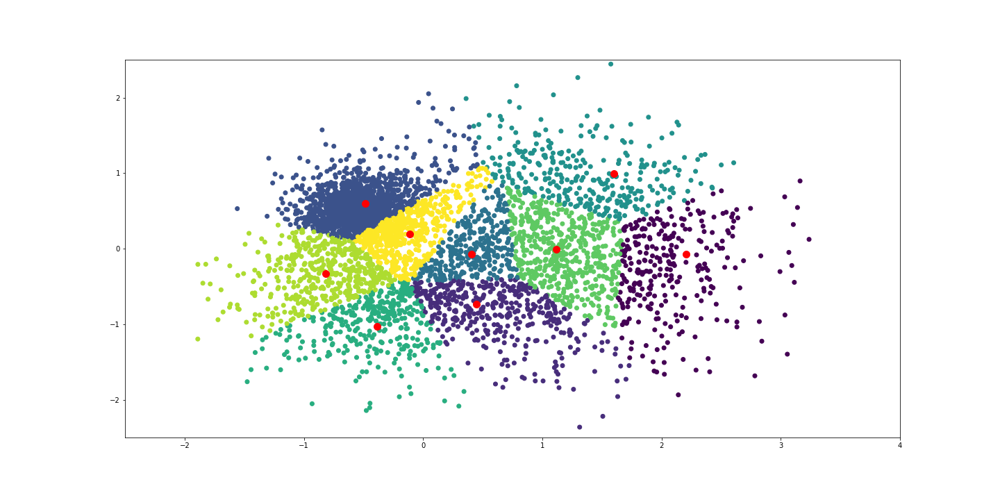
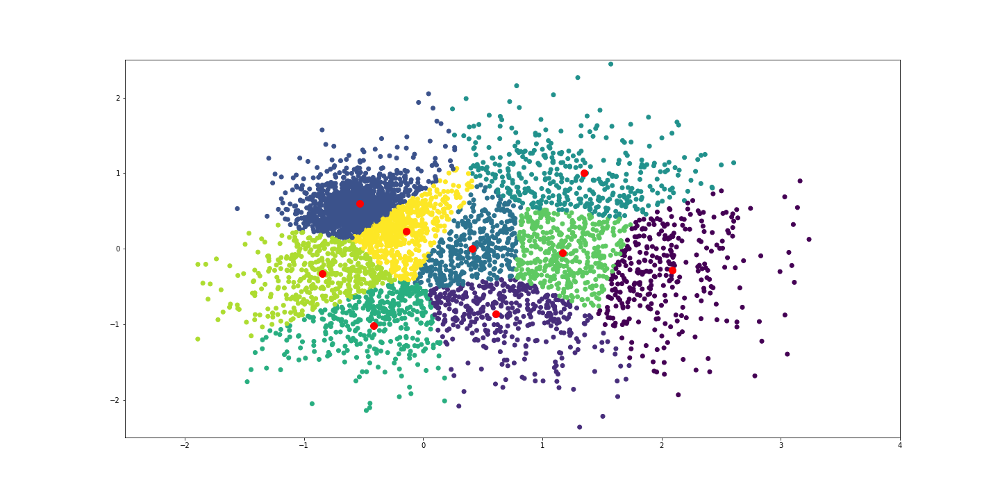
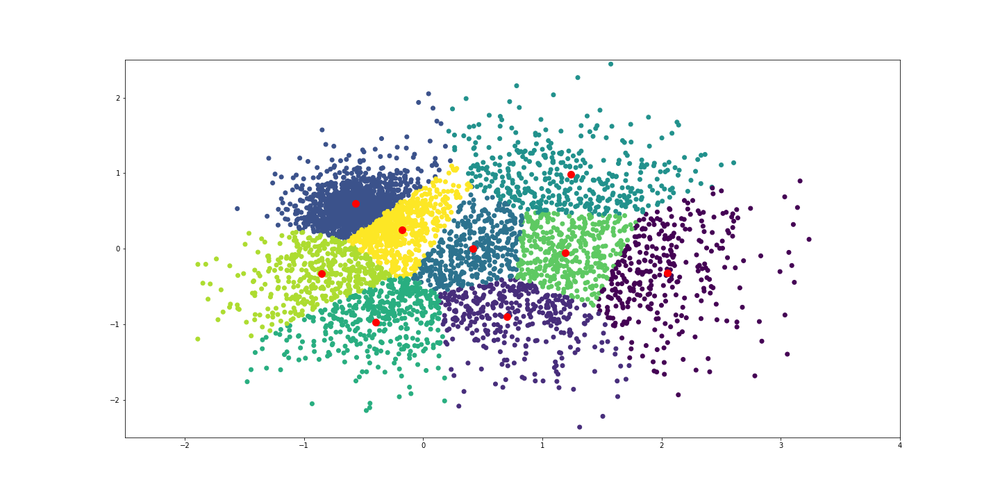
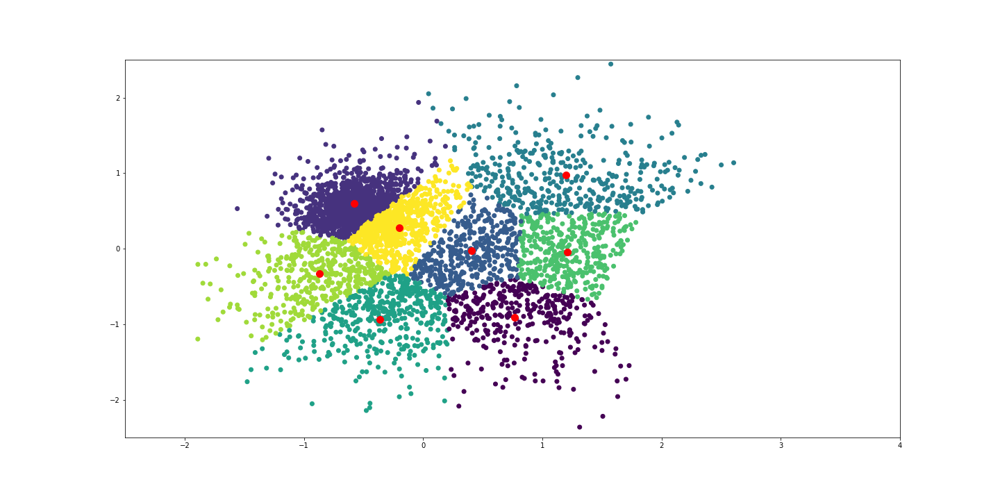
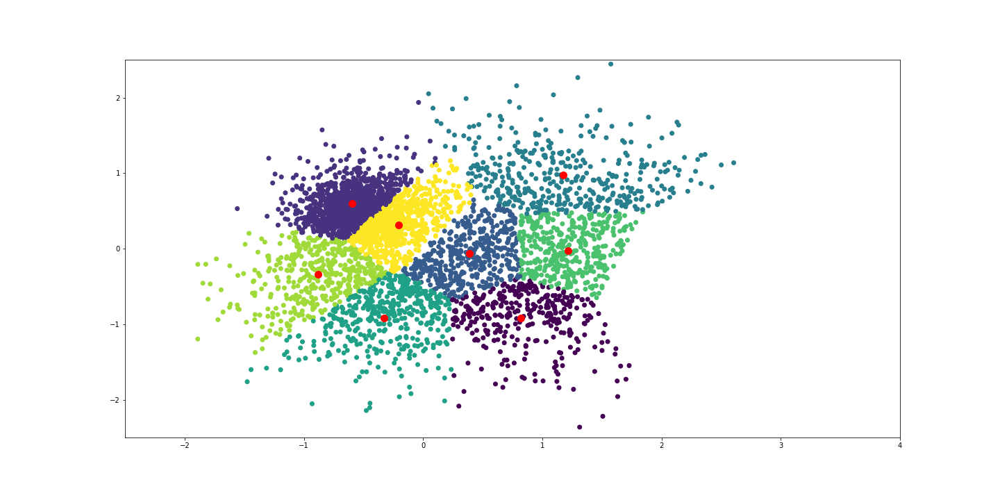
...
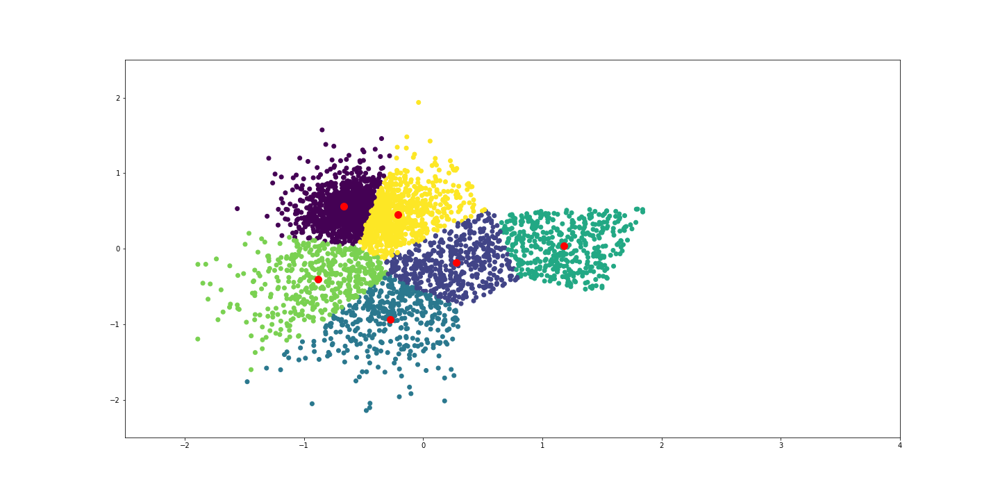
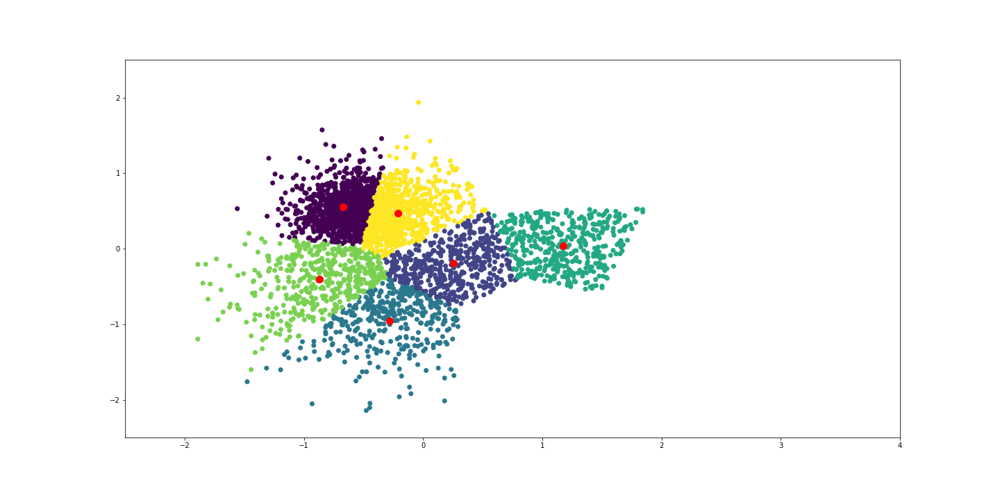
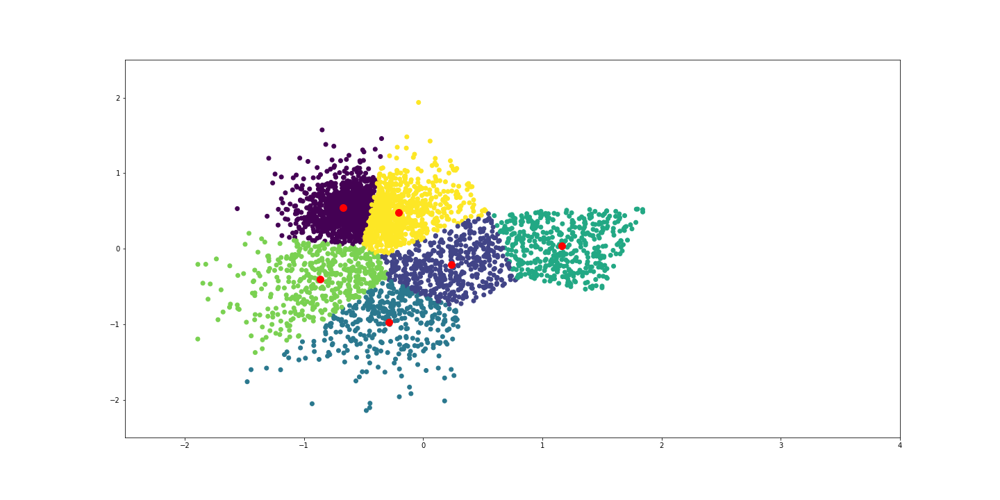
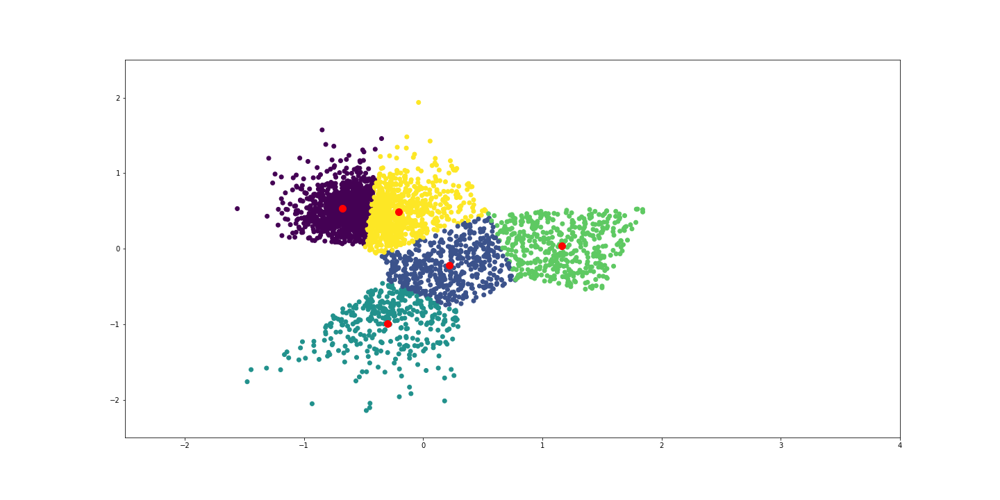
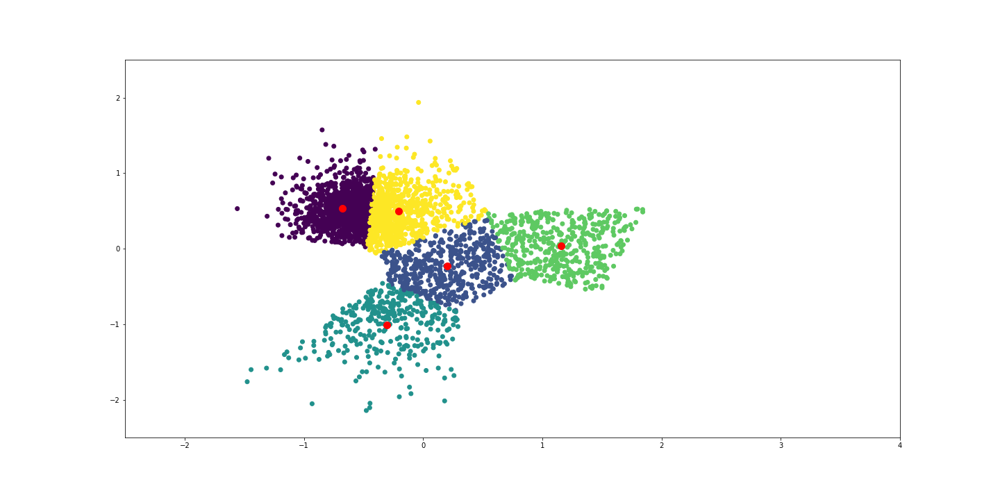

In [65]:
mode = 'purge'
centroids = original_centroids
animation.FuncAnimation(fig, animate, init_func=init,
                        frames=15, interval=1, blit=True)